# Начало работы.

## Импорт библиотек.

In [483]:
import numpy as np
import pandas as pd
import matplotlib .pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
import seaborn as seabornInstance
from sklearn.model_selection import train_test_split 
from sklearn import preprocessing
from sklearn import metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, median_absolute_error, r2_score
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.compat import lzip
from statsmodels.stats.diagnostic import het_white
from statsmodels.stats.diagnostic import het_goldfeldquandt
from statsmodels.stats.diagnostic import het_breuschpagan
import scipy.stats as stats
from scipy. stats import boxcox

from sklearn.linear_model import LinearRegression

## Загрузка датасета.

In [3]:
df = pd.read_csv('selling_apartments.csv')

In [4]:
df.head(15)

,object_type,type,rooms,level,kitchen_area,living_area,area,price_by_meter,price,material,...,build_walls,heating,gas,longitude,latitude,agencyName,areaRating,city,remoute_from_center,build_oldest
0,Вторичная,Не заполнено,1,1/5,4.0,12.0,17.5,45714.0,800000.0,Кирпич,...,Не заполнено,0,0,47.843059,56.636595,Игорь,3.634451,Йошкар-Ола,2.938233,new
1,Вторичная,Многоквартирный дом,5,4/5,9.4,NaN,172.0,56686.0,9750000.0,Кирпич,...,Кирпич,Центральное,Да,47.873457,56.638132,Наталья,3.634451,Йошкар-Ола,1.065337,old
2,Вторичная,Квартира,2,5/9,9.0,40.0,59.0,74576.0,4399999.0,Кирпич,...,0,0,0,47.827168,56.641107,Агенство недвижимости «MAKLER»,3.634451,Йошкар-Ола,3.911779,new
3,Вторичная,Многоквартирный дом,3,3/9,7.0,42.0,71.3,47686.0,3400000.0,Панель,...,Панельные,Центральное,Да,47.915607,56.628476,Владимир,3.634451,Йошкар-Ола,1.906634,old
4,Новостройка,Квартира,2,9/10,10.0,30.0,60.0,71167.0,4270000.0,Кирпич,...,0,0,0,47.845170,56.645330,-,3.634451,Йошкар-Ола,2.892146,new
5,Вторичная,Квартира,1,8/9,9.0,18.0,39.0,72308.0,2820000.0,Кирпич,...,0,0,0,47.822533,56.640966,Агенство недвижимости «MAKLER»,3.634451,Йошкар-Ола,4.194633,new
6,Вторичная,Квартира,1,6/9,9.0,17.0,39.0,73846.0,2880000.0,Кирпич,...,0,0,0,47.821051,56.641025,Агенство недвижимости «MAKLER»,3.634451,Йошкар-Ола,4.285790,new
7,Вторичная,Многоквартирный дом,2,2/7,14.6,NaN,82.0,65000.0,5330000.0,Кирпич,...,Кирпич,Квартирное отопление (квартирный котел),0,47.894838,56.649444,Наталья,3.634451,Йошкар-Ола,1.214381,new
8,Вторичная,Многоквартирный дом,3,2/9,30.0,36.0,70.0,49000.0,3430000.0,Панель,...,Панельные,Центральное,Нет,47.908178,56.627565,Дмитрий,3.634451,Йошкар-Ола,1.642182,old
9,Вторичная,Многоквартирный дом,1,5/5,12.4,NaN,39.7,70529.0,2800000.0,Кирпич,...,Кирпич,0,0,47.977546,56.642456,Марина,3.634451,Йошкар-Ола,5.339482,new


Формирование нового датафрейма с информацией о квартирах только в Москве, так как исследуется только стоимость квартир на вторичном рынке в Москве.

In [5]:
df_m = df[df.city == 'Москва']
df_m.head()

,object_type,type,rooms,level,kitchen_area,living_area,area,price_by_meter,price,material,...,build_walls,heating,gas,longitude,latitude,agencyName,areaRating,city,remoute_from_center,build_oldest
1588,Вторичная,Квартира,2,14/22,13.0,22.00,51.2,232422.0,11900000.0,Монолит,...,0,0,0,37.639150,55.901748,Alliance Agency Real Estate,3.838891,Москва,16.713765,new
1589,Вторичная,Квартира,2,6/22,14.1,27.00,52.5,227619.0,11950000.0,Монолит,...,0,0,0,37.639375,55.901594,Alliance Agency Real Estate,3.838891,Москва,16.697950,new
1590,Вторичная,Квартира,3,10/22,13.0,37.50,65.8,223404.0,14700000.0,Монолит,...,0,0,0,37.639150,55.901748,Alliance Agency Real Estate,3.838891,Москва,16.713765,new
1591,Новостройка,Квартира,2,2/17,5.5,NaN,65.8,490880.0,32299904.0,Монолит,...,0,0,0,37.580400,55.780160,MR Group,3.601982,Москва,3.814125,new
1592,0,0,0,0,0.0,58.58,0.0,0.0,0.0,0,...,0,0,0,37.705660,55.767180,0,3.649023,Москва,5.896552,new


## Первичный анализ, подготовка и чистка данных.

In [6]:
df_m.columns

Index(['object_type', 'type', 'rooms', 'level', 'kitchen_area', 'living_area',
       'area', 'price_by_meter', 'price', 'material', 'published', 'updated',
       'build_year', 'build_serias', 'build_type', 'max_levels', 'min_levels',
       'rubbish_chute', 'enterances', 'build_overlap', 'build_walls',
       'heating', 'gas', 'longitude', 'latitude', 'agencyName', 'areaRating',
       'city', 'remoute_from_center', 'build_oldest'],
      dtype='object')

Просмотр информации о датафрейме.

In [7]:
df_m.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78111 entries, 1588 to 79698
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   object_type          78111 non-null  object 
 1   type                 78111 non-null  object 
 2   rooms                78111 non-null  int64  
 3   level                78111 non-null  object 
 4   kitchen_area         62900 non-null  float64
 5   living_area          51656 non-null  float64
 6   area                 78111 non-null  float64
 7   price_by_meter       78111 non-null  float64
 8   price                78111 non-null  float64
 9   material             77967 non-null  object 
 10  published            78111 non-null  object 
 11  updated              78111 non-null  object 
 12  build_year           78111 non-null  int64  
 13  build_serias         78111 non-null  object 
 14  build_type           78111 non-null  int64  
 15  max_levels           78111 non-nu

Подсчёт нулевых значений (NaN) по столбцам.

In [8]:
df_m.isnull().sum()

object_type                0
type                       0
rooms                      0
level                      0
kitchen_area           15211
living_area            26455
area                       0
price_by_meter             0
price                      0
material                 144
published                  0
updated                    0
build_year                 0
build_serias               0
build_type                 0
max_levels                 0
min_levels                 0
rubbish_chute              0
enterances                 0
build_overlap              0
build_walls                0
heating                    0
gas                        0
longitude                  0
latitude                   0
agencyName                 0
areaRating                 0
city                       0
remoute_from_center        0
build_oldest               0
dtype: int64

Удаление нулевых значений.

In [9]:
df_m = df_m.dropna(subset=['living_area', 'kitchen_area', 'material'])

Проверка.

In [10]:
df_m.isnull().sum()

object_type            0
type                   0
rooms                  0
level                  0
kitchen_area           0
living_area            0
area                   0
price_by_meter         0
price                  0
material               0
published              0
updated                0
build_year             0
build_serias           0
build_type             0
max_levels             0
min_levels             0
rubbish_chute          0
enterances             0
build_overlap          0
build_walls            0
heating                0
gas                    0
longitude              0
latitude               0
agencyName             0
areaRating             0
city                   0
remoute_from_center    0
build_oldest           0
dtype: int64

Подсчитываем число дубликатов

In [11]:
len(df_m) - len(df_m.drop_duplicates())

402

In [12]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

Удаляем дубликаты

In [13]:
df_m = df_m.drop_duplicates()

Проверяем

In [14]:
len(df_m) - len(df_m.drop_duplicates())

0

Нахождение уникальных значений столбца 'object_type' и 'type'.

In [15]:
df_m.object_type.unique()

array(['Вторичная', '0', 'Новостройка'], dtype=object)

In [16]:
df_m.type.unique()

array(['Квартира', '0', 'Многоквартирный дом', 'Не заполнено',
       'Жилой дом блокированной застройки',
       'Специализированный жилищный фонд'], dtype=object)

Удаление строк где значение '0' или 'Не заполнено'.

In [17]:
df_m = df_m.drop(df_m[(df_m.object_type == '0') | (df_m.type == 'Не заполнено')].index)

Проверка

In [18]:
df_m.object_type.unique()

array(['Вторичная', 'Новостройка'], dtype=object)

In [19]:
df_m.type.unique()

array(['Квартира', 'Многоквартирный дом',
       'Жилой дом блокированной застройки',
       'Специализированный жилищный фонд'], dtype=object)

In [20]:
df_m.build_walls.unique()

array(['0', 'Кирпич', 'Монолитные', 'Панельные', 'Железобетон',
       'Каменные, кирпичные', 'Не заполнено', 'Блочные', 'Смешанные',
       'Железобетонная панель', 'Деревянные'], dtype=object)

Удаление всех строк кроме, кроме строк с информацией о квартирах на вторичном рынке, так как иследуется только стоимость квартир на вторичном рынке Москвы.

In [21]:
df_m = df_m[df_m.object_type == 'Вторичная']

In [22]:
df_m[:1000]

,object_type,type,rooms,level,kitchen_area,living_area,area,price_by_meter,price,material,published,updated,build_year,build_serias,build_type,max_levels,min_levels,rubbish_chute,enterances,build_overlap,build_walls,heating,gas,longitude,latitude,agencyName,areaRating,city,remoute_from_center,build_oldest
1588,Вторичная,Квартира,2,14/22,13.0,22.0,51.2,232422.0,1.190000e+07,Монолит,28/1/2022,10/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.639150,55.901748,Alliance Agency Real Estate,3.838891,Москва,16.713765,new
1589,Вторичная,Квартира,2,6/22,14.1,27.0,52.5,227619.0,1.195000e+07,Монолит,10/2/2022,10/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.639375,55.901594,Alliance Agency Real Estate,3.838891,Москва,16.697950,new
1590,Вторичная,Квартира,3,10/22,13.0,37.5,65.8,223404.0,1.470000e+07,Монолит,10/2/2022,10/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.639150,55.901748,Alliance Agency Real Estate,3.838891,Москва,16.713765,new
1606,Вторичная,Квартира,2,12/15,20.3,30.1,67.6,177515.0,1.200000e+07,Панель,7/2/2022,10/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.585377,55.526811,Ася,3.838891,Москва,25.167842,new
1608,Вторичная,Многоквартирный дом,3,3/9,10.0,41.0,67.0,308955.0,2.070000e+07,Кирпич,10/2/2022,10/2/2022,1998,индивидуальный проект,0,9,9,Есть,3,Железобетонные,Кирпич,Центральное,Нет,37.531756,55.832353,kvartira,3.800195,Москва,10.355340,middle
1609,Вторичная,Многоквартирный дом,3,21/33,17.6,66.1,115.0,347739.0,3.999000e+07,Монолит,29/9/2021,10/2/2022,2012,индивидуальный,0,33,19,Есть,6,Железобетонные,Монолитные,Центральное,Нет,37.634256,55.676473,Алексей,3.866545,Москва,8.514863,new
1610,Вторичная,Многоквартирный дом,2,7/10,8.8,30.0,53.6,238806.0,1.280000e+07,Панель,9/12/2021,9/2/2022,2003,ГМС-2001,0,10,0,Есть,5,Железобетонные,Панельные,Центральное,Да,37.791954,55.671158,Светлана,3.226191,Москва,14.296366,middle
1615,Вторичная,Квартира,3,1/17,16.8,42.0,79.7,198871.0,1.585000e+07,Монолит,10/1/2022,10/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.480108,55.546626,Руслан,3.838891,Москва,24.426745,new
1618,Вторичная,Квартира,0,5/6,5.0,15.0,20.0,340000.0,6.800000e+06,Кирпич,9/2/2022,9/2/2022,0,0,0,0,0,0,0,0,0,0,0,37.798475,55.725042,александра,3.739856,Москва,11.881251,new
1620,Вторичная,Многоквартирный дом,1,1/14,12.0,16.0,35.0,428571.0,1.500000e+07,Кирпич,28/10/2021,10/2/2022,1967,П-29,0,14,14,Есть,1,Железобетонные,Кирпич,Центральное,Да,37.509631,55.711706,александра,4.093809,Москва,8.039513,old


Подсчёт значений в столбцах где недостающая информация заменена на 0.

In [23]:
len(df_m[(df_m['build_year'] == 0) | (df_m['rubbish_chute'] == '0') | (df_m['build_overlap'] == '0') | (df_m['build_walls'] == '0') | (df_m['heating'] == '0') | (df_m['gas'] == '0')])

6856

Удаление строк с недостающей информацией (там где информация заменена на 0).

In [24]:
df_m = df_m.drop(df_m[(df_m.build_year == 0) | (df_m.rubbish_chute == '0') | (df_m.build_overlap == '0') | (df_m.build_walls == '0') | (df_m.heating == '0') | (df_m.gas == '0')].index)

Удаление строк из столбца 'build_walls' с недостающей информацией ("Не заполнено").

In [25]:
df_m = df_m.drop(df_m[(df_m.build_walls == 'Не заполнено')].index)

Удаление незначащих столбцов.

In [26]:
df_m.drop(['build_serias', 'min_levels', 'build_type', 'agencyName', 'object_type', 'city', 'longitude', 'latitude', 'updated'], axis= 1 , inplace= True)

In [27]:
df_m.drop(['build_walls'], axis= 1 , inplace= True)

In [28]:
df_m.rename(columns = {'material':'build_walls'}, inplace = True )

In [29]:
df_m[:100]

,type,rooms,level,kitchen_area,living_area,area,price_by_meter,price,build_walls,published,build_year,max_levels,rubbish_chute,enterances,build_overlap,heating,gas,areaRating,remoute_from_center,build_oldest
1608,Многоквартирный дом,3,3/9,10.0,41.0,67.0,308955.0,20700000.0,Кирпич,10/2/2022,1998,9,Есть,3,Железобетонные,Центральное,Нет,3.800195,10.355340,middle
1609,Многоквартирный дом,3,21/33,17.6,66.1,115.0,347739.0,39990000.0,Монолит,29/9/2021,2012,33,Есть,6,Железобетонные,Центральное,Нет,3.866545,8.514863,new
1610,Многоквартирный дом,2,7/10,8.8,30.0,53.6,238806.0,12800000.0,Панель,9/12/2021,2003,10,Есть,5,Железобетонные,Центральное,Да,3.226191,14.296366,middle
1620,Многоквартирный дом,1,1/14,12.0,16.0,35.0,428571.0,15000000.0,Кирпич,28/10/2021,1967,14,Есть,1,Железобетонные,Центральное,Да,4.093809,8.039513,old
1625,Многоквартирный дом,2,4/8,7.3,38.1,58.0,431034.0,25000000.0,Кирпич,14/2/2021,1930,8,Есть,5,Деревянные,Центральное,Да,3.811937,2.789957,old
1635,Многоквартирный дом,4,1/5,9.3,69.9,97.2,360082.0,35000000.0,Кирпич,1/1/2017,1957,5,Нет,3,Железобетонные,Центральное,Да,3.922360,3.195146,old
1636,Многоквартирный дом,1,9/17,8.4,17.8,38.1,270315.0,10299000.0,Панель,31/8/2021,2008,17,Есть,5,Железобетонные,Центральное,Нет,4.095343,19.602507,middle
1638,Многоквартирный дом,1,8/9,6.0,22.0,34.0,398529.0,13550000.0,Панель,18/1/2022,1963,9,Есть,1,Железобетонные,Центральное,Да,3.888750,9.328057,old
1639,Многоквартирный дом,4,2/24,15.0,82.0,139.0,226619.0,31500000.0,Кирпич,9/2/2022,2005,24,Есть,1,Железобетонные,Центральное,Нет,3.704217,15.476036,middle
1640,Многоквартирный дом,3,5/6,21.5,70.0,124.0,564516.0,70000000.0,Кирпич,9/2/2022,1910,5,Нет,2,Железобетонные,Центральное,Да,3.873555,2.123254,old


Сброс индекса после удаления строк.

df_m = df_m.reset_index(drop=True)

In [30]:
df_m.columns

Index(['type', 'rooms', 'level', 'kitchen_area', 'living_area', 'area',
       'price_by_meter', 'price', 'build_walls', 'published', 'build_year',
       'max_levels', 'rubbish_chute', 'enterances', 'build_overlap', 'heating',
       'gas', 'areaRating', 'remoute_from_center', 'build_oldest'],
      dtype='object')

Изменим порядок столбцов.

In [31]:
df_m = df_m[['published', 'price', 'price_by_meter', 'area', 'living_area', 'kitchen_area', 'rooms', 'level', 'max_levels',
             'build_year', 'enterances', 'remoute_from_center', 'areaRating', 'type', 'rubbish_chute', 'build_walls',
             'build_overlap', 'heating', 'gas', 'build_oldest']]

In [32]:
df_m[:10]

,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,build_year,enterances,remoute_from_center,areaRating,type,rubbish_chute,build_walls,build_overlap,heating,gas,build_oldest
1608,10/2/2022,20700000.0,308955.0,67.0,41.0,10.0,3,3/9,9,1998,3,10.355340,3.800195,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Нет,middle
1609,29/9/2021,39990000.0,347739.0,115.0,66.1,17.6,3,21/33,33,2012,6,8.514863,3.866545,Многоквартирный дом,Есть,Монолит,Железобетонные,Центральное,Нет,new
1610,9/12/2021,12800000.0,238806.0,53.6,30.0,8.8,2,7/10,10,2003,5,14.296366,3.226191,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Да,middle
1620,28/10/2021,15000000.0,428571.0,35.0,16.0,12.0,1,1/14,14,1967,1,8.039513,4.093809,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Да,old
1625,14/2/2021,25000000.0,431034.0,58.0,38.1,7.3,2,4/8,8,1930,5,2.789957,3.811937,Многоквартирный дом,Есть,Кирпич,Деревянные,Центральное,Да,old
1635,1/1/2017,35000000.0,360082.0,97.2,69.9,9.3,4,1/5,5,1957,3,3.195146,3.922360,Многоквартирный дом,Нет,Кирпич,Железобетонные,Центральное,Да,old
1636,31/8/2021,10299000.0,270315.0,38.1,17.8,8.4,1,9/17,17,2008,5,19.602507,4.095343,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,middle
1638,18/1/2022,13550000.0,398529.0,34.0,22.0,6.0,1,8/9,9,1963,1,9.328057,3.888750,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Да,old
1639,9/2/2022,31500000.0,226619.0,139.0,82.0,15.0,4,2/24,24,2005,1,15.476036,3.704217,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Нет,middle
1640,9/2/2022,70000000.0,564516.0,124.0,70.0,21.5,3,5/6,5,1910,2,2.123254,3.873555,Многоквартирный дом,Нет,Кирпич,Железобетонные,Центральное,Да,old


Изменим формат записи даты на стандартый.

In [33]:
df_m.published = df_m.published.replace('/', '-')

Преобразования столбца "published" (дата публикации) в объект даты и времени для дальнейшей сортировки.

In [34]:
df_m['published'] = pd.to_datetime(df_m['published'])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '28/10/2021' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '22/11/2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '29/11/2021' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '22/12/2021' in DD/MM/YYYY format. Provide format or specif

Сортировка значений по дате.

In [35]:
df_m = df_m.sort_values(by = 'published')

Сброс индексов.

In [36]:
df_m = df_m.reset_index(drop=True)

In [37]:
df_m[:2000]

,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,build_year,enterances,remoute_from_center,areaRating,type,rubbish_chute,build_walls,build_overlap,heating,gas,build_oldest
0,2012-11-04,39000000.0,428571.0,91.0,60.0,8.0,3,9/10,7,1910,2,4.093029,3.873555,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Да,old
1,2014-03-12,12300000.0,236538.0,52.0,28.0,11.0,2,16/22,22,2007,2,25.609344,4.166810,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,middle
2,2014-03-12,79000000.0,329167.0,240.0,150.0,15.0,8,3/6,6,1913,7,2.280625,3.450476,Многоквартирный дом,Нет,Кирпич,Деревянные,Центральное,Да,old
3,2014-04-18,13500000.0,250000.0,54.0,8.8,31.0,2,12/12,12,1979,10,11.304979,3.845708,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,old
4,2014-08-25,16400000.0,282759.0,58.0,43.0,9.0,2,21/25,25,2013,1,13.677698,3.635021,Многоквартирный дом,Есть,Монолит,Железобетонные,Центральное,Нет,new
5,2014-09-12,89800000.0,748333.0,120.0,90.0,17.0,4,7/14,57,2006,8,7.873228,4.127402,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Нет,middle
6,2014-10-13,75400000.0,554412.0,136.0,92.0,12.0,4,2/7,6,1914,3,2.602688,3.811937,Многоквартирный дом,Нет,Кирпич,Смешанные,Центральное,Да,old
7,2014-10-14,25000000.0,428082.0,58.4,34.0,14.0,1,13/25,25,2008,9,9.446538,3.926090,Многоквартирный дом,Есть,Монолит,Железобетонные,Центральное,Нет,middle
8,2014-10-25,73500000.0,612500.0,120.0,60.0,15.0,3,2/5,5,1912,1,2.107501,3.838891,Многоквартирный дом,Нет,Кирпич,Деревянные,Центральное,Да,old
9,2014-11-18,515000000.0,1044625.0,493.0,350.0,42.0,5,8/8,8,2012,4,1.148273,3.838891,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new


Данных за 2012 - 2020 года очень мало по сравнению с данными за 2021 и 2022 года, поэтому удалим их и оставим только свежие данные за 2021 - 2022 года.

In [38]:
df_m = df_m.iloc[558:]

In [39]:
df_m = df_m.reset_index(drop=True)

In [40]:
df_m.head()

,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,build_year,enterances,remoute_from_center,areaRating,type,rubbish_chute,build_walls,build_overlap,heating,gas,build_oldest
0,2021-01-02,36200000.0,218599.0,165.6,69.0,36.0,3,8/56,58,2015,1,9.661126,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
1,2021-01-02,16000000.0,176211.0,90.8,48.2,15.5,2,22/23,23,2007,8,17.226491,3.915275,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,middle
2,2021-01-02,35700000.0,446250.0,80.0,50.0,9.0,3,8/8,8,1957,7,6.411227,3.573903,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Да,old
3,2021-01-02,30850000.0,283028.0,109.0,47.0,15.0,3,28/58,58,2014,1,9.537724,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
4,2021-01-02,31800000.0,291743.0,109.0,58.0,18.0,3,44/56,58,2015,1,9.660830,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new


Приведём форму записи этажа в нормальный вид.

In [41]:
df_m[['level', 'delete']] = df_m['level'].str.split('/', 1, expand=True)

In [42]:
df_m.drop('delete', axis= 1 , inplace= True)

In [43]:
df_m.head()

,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,build_year,enterances,remoute_from_center,areaRating,type,rubbish_chute,build_walls,build_overlap,heating,gas,build_oldest
0,2021-01-02,36200000.0,218599.0,165.6,69.0,36.0,3,8,58,2015,1,9.661126,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
1,2021-01-02,16000000.0,176211.0,90.8,48.2,15.5,2,22,23,2007,8,17.226491,3.915275,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,middle
2,2021-01-02,35700000.0,446250.0,80.0,50.0,9.0,3,8,8,1957,7,6.411227,3.573903,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Да,old
3,2021-01-02,30850000.0,283028.0,109.0,47.0,15.0,3,28,58,2014,1,9.537724,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
4,2021-01-02,31800000.0,291743.0,109.0,58.0,18.0,3,44,58,2015,1,9.660830,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new


Добавим столбец с нумерацией.

In [44]:
df_m['№']=np.arange(len(df_m))[::1]+1

In [45]:
df_m.columns

Index(['published', 'price', 'price_by_meter', 'area', 'living_area',
       'kitchen_area', 'rooms', 'level', 'max_levels', 'build_year',
       'enterances', 'remoute_from_center', 'areaRating', 'type',
       'rubbish_chute', 'build_walls', 'build_overlap', 'heating', 'gas',
       'build_oldest', '№'],
      dtype='object')

In [46]:
df_m = df_m[['№', 'published', 'price', 'price_by_meter', 'area', 'living_area', 'kitchen_area', 'rooms', 'level', 'max_levels',
             'build_year', 'enterances', 'remoute_from_center', 'areaRating', 'type', 'rubbish_chute',
             'build_walls', 'build_overlap', 'heating', 'gas', 'build_oldest']]

Просмотр уникальных значений по столбцам с качественными данными и подсчёт уникальных значений:

In [47]:
df_m.type.unique()

array(['Многоквартирный дом', 'Жилой дом блокированной застройки',
       'Специализированный жилищный фонд'], dtype=object)

In [48]:
df_m['type'].value_counts()

Многоквартирный дом                  15376
Жилой дом блокированной застройки       47
Специализированный жилищный фонд         2
Name: type, dtype: int64

In [49]:
df_m.rubbish_chute.unique()

array(['Нет', 'Есть'], dtype=object)

In [50]:
df_m['rubbish_chute'].value_counts()

Есть    12099
Нет      3326
Name: rubbish_chute, dtype: int64

In [51]:
df_m.build_walls.unique()

array(['Монолит', 'Панель', 'Кирпич', 'Блоки', 'Дерево'], dtype=object)

In [52]:
df_m['build_walls'].value_counts()

Панель     7372
Кирпич     4345
Монолит    2827
Блоки       872
Дерево        9
Name: build_walls, dtype: int64

In [53]:
df_m.build_overlap.unique()

array(['Железобетонные', 'Деревянные', 'Смешанные'], dtype=object)

In [54]:
df_m['build_overlap'].value_counts()

Железобетонные    14501
Деревянные          583
Смешанные           341
Name: build_overlap, dtype: int64

In [55]:
df_m.heating.unique()

array(['Центральное',
       'Автономная котельная (крышная, встроенно-пристроенная)',
       'Индивидуальный тепловой пункт (ИТП)', 'Нет',
       'Квартирное отопление (квартирный котел)', 'Печное'], dtype=object)

In [56]:
df_m['heating'].value_counts()

Центральное                                               14473
Индивидуальный тепловой пункт (ИТП)                         717
Автономная котельная (крышная, встроенно-пристроенная)      176
Нет                                                          40
Квартирное отопление (квартирный котел)                      18
Печное                                                        1
Name: heating, dtype: int64

In [57]:
df_m.gas.unique()

array(['Нет', 'Да'], dtype=object)

In [58]:
df_m['gas'].value_counts()

Нет    8022
Да     7403
Name: gas, dtype: int64

In [59]:
df_m.build_oldest.unique()

array(['new', 'middle', 'old'], dtype=object)

In [60]:
df_m['build_oldest'].value_counts()

old       10263
new        2664
middle     2498
Name: build_oldest, dtype: int64

In [61]:
# создание копии датасета
df_f = df_m

In [62]:
df_f.head()

,№,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,build_year,enterances,remoute_from_center,areaRating,type,rubbish_chute,build_walls,build_overlap,heating,gas,build_oldest
0,1,2021-01-02,36200000.0,218599.0,165.6,69.0,36.0,3,8,58,2015,1,9.661126,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
1,2,2021-01-02,16000000.0,176211.0,90.8,48.2,15.5,2,22,23,2007,8,17.226491,3.915275,Многоквартирный дом,Есть,Панель,Железобетонные,Центральное,Нет,middle
2,3,2021-01-02,35700000.0,446250.0,80.0,50.0,9.0,3,8,8,1957,7,6.411227,3.573903,Многоквартирный дом,Есть,Кирпич,Железобетонные,Центральное,Да,old
3,4,2021-01-02,30850000.0,283028.0,109.0,47.0,15.0,3,28,58,2014,1,9.537724,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new
4,5,2021-01-02,31800000.0,291743.0,109.0,58.0,18.0,3,44,58,2015,1,9.660830,3.926090,Многоквартирный дом,Нет,Монолит,Железобетонные,Центральное,Нет,new


## Создание фиктивных переменных.

Воспользуемся функцией get_dummies (создание манекенов) для создания фиктивных переменных по имеющимся категориальным признакам:

In [63]:
df_f = pd.get_dummies(df_f, columns=['type', 'rubbish_chute', 'build_walls', 'build_overlap', 'heating', 'gas', 'build_oldest'],
                            prefix=['type', 'rubbish_chute', 'walls', 'overlap', 'heating', 'gas', 'build_oldest'], drop_first= True)

In [64]:
df_f.shape

(15425, 31)

In [65]:
df_f['level'] = df_f['level'].astype('int64') 

Посчитаем возраст здания, так как это более важная и пригодная для анализа характеристика, чем год постройки здания:

In [66]:
df_f.insert(9, 'today', 2023)

In [67]:
df_f.insert(10, 'building age', df_f['today'] - df_f['build_year'])

и удалим ненужные столбцы:

In [68]:
df_f.drop(['today', 'build_year'], axis= 1 , inplace= True )

In [69]:
df_f.columns

Index(['№', 'published', 'price', 'price_by_meter', 'area', 'living_area',
       'kitchen_area', 'rooms', 'level', 'building age', 'max_levels',
       'enterances', 'remoute_from_center', 'areaRating',
       'type_Многоквартирный дом', 'type_Специализированный жилищный фонд',
       'rubbish_chute_Нет', 'walls_Дерево', 'walls_Кирпич', 'walls_Монолит',
       'walls_Панель', 'overlap_Железобетонные', 'overlap_Смешанные',
       'heating_Индивидуальный тепловой пункт (ИТП)',
       'heating_Квартирное отопление (квартирный котел)', 'heating_Нет',
       'heating_Печное', 'heating_Центральное', 'gas_Нет', 'build_oldest_new',
       'build_oldest_old'],
      dtype='object')

In [70]:
df_f = df_f[['№', 'published', 'price', 'price_by_meter', 'area', 'living_area',
       'kitchen_area', 'rooms', 'level', 'max_levels', 'building age',
       'enterances', 'remoute_from_center', 'areaRating',
       'type_Многоквартирный дом', 'type_Специализированный жилищный фонд',
       'rubbish_chute_Нет', 'walls_Дерево', 'walls_Кирпич', 'walls_Монолит',
       'walls_Панель', 'overlap_Железобетонные', 'overlap_Смешанные',
       'heating_Индивидуальный тепловой пункт (ИТП)',
       'heating_Квартирное отопление (квартирный котел)', 'heating_Нет',
       'heating_Печное', 'heating_Центральное', 'gas_Нет', 'build_oldest_new',
       'build_oldest_old']]

In [71]:
df_f.head()

,№,published,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,building age,enterances,remoute_from_center,areaRating,type_Многоквартирный дом,type_Специализированный жилищный фонд,rubbish_chute_Нет,walls_Дерево,walls_Кирпич,walls_Монолит,walls_Панель,overlap_Железобетонные,overlap_Смешанные,heating_Индивидуальный тепловой пункт (ИТП),heating_Квартирное отопление (квартирный котел),heating_Нет,heating_Печное,heating_Центральное,gas_Нет,build_oldest_new,build_oldest_old
0,1,2021-01-02,36200000.0,218599.0,165.6,69.0,36.0,3,8,58,8,1,9.661126,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0
1,2,2021-01-02,16000000.0,176211.0,90.8,48.2,15.5,2,22,23,16,8,17.226491,3.915275,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0
2,3,2021-01-02,35700000.0,446250.0,80.0,50.0,9.0,3,8,8,66,7,6.411227,3.573903,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1
3,4,2021-01-02,30850000.0,283028.0,109.0,47.0,15.0,3,28,58,9,1,9.537724,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0
4,5,2021-01-02,31800000.0,291743.0,109.0,58.0,18.0,3,44,58,8,1,9.660830,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0


## Преданализ данных

Вывод основных статистических показателей.

In [72]:
df_f.describe()

,№,price,price_by_meter,area,living_area,kitchen_area,rooms,level,max_levels,building age,enterances,remoute_from_center,areaRating,type_Многоквартирный дом,type_Специализированный жилищный фонд,rubbish_chute_Нет,walls_Дерево,walls_Кирпич,walls_Монолит,walls_Панель,overlap_Железобетонные,overlap_Смешанные,heating_Индивидуальный тепловой пункт (ИТП),heating_Квартирное отопление (квартирный котел),heating_Нет,heating_Печное,heating_Центральное,gas_Нет,build_oldest_new,build_oldest_old
count,15425.000000,1.542500e+04,1.542500e+04,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000
mean,7713.000000,2.604778e+07,3.319145e+05,63.989115,39.341018,9.571352,2.046159,6.364538,13.263533,42.264959,4.830729,11.979200,3.834764,0.996823,0.000130,0.215624,0.000583,0.281686,0.183274,0.477925,0.940097,0.022107,0.046483,0.001167,0.002593,0.000065,0.938282,0.520065,0.172707,0.665348
std,4452.958286,5.984272e+07,2.049370e+05,54.546735,35.695746,6.569037,1.278491,5.891278,7.977031,25.982821,3.511254,6.229280,0.223132,0.056274,0.011386,0.411268,0.024149,0.449835,0.386903,0.499529,0.237314,0.147036,0.210535,0.034142,0.050859,0.008052,0.240650,0.499613,0.378006,0.471884
min,1.000000,1.000000e+05,1.767000e+03,10.000000,5.000000,2.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.571863,3.168778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3857.000000,1.049000e+07,2.462960e+05,37.900000,19.500000,6.000000,1.000000,2.000000,9.000000,19.000000,2.000000,7.782712,3.734624,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,7713.000000,1.400000e+07,2.875000e+05,52.000000,31.000000,8.600000,2.000000,5.000000,12.000000,46.000000,4.000000,11.882122,3.841749,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
75%,11569.000000,2.161720e+07,3.493510e+05,74.000000,45.000000,10.700000,3.000000,9.000000,17.000000,58.000000,6.000000,15.509335,3.967912,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,15425.000000,2.618052e+09,1.228327e+07,975.000000,690.000000,100.000000,10.000000,54.000000,58.000000,238.000000,27.000000,41.683695,4.627057,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Из полученных статистик можно судить о наличии выбросов, например, у таких факторов, как: 'price', 'price_by_meter', 'area' и т. д., так как максимальное значение данных факторов очень сильно отличается от 75 процентиля, это может негативно сказаться на качестве модели, но это предварительные гипотезы, которые следует изучить более бодробно в дальнейшем.

    № -
    published -
    price - y
    price_by_meter - x1
    area - x2
    living_area - x3
    kitchen_area - x4
    rooms - x5
    level - x6
    max_levels - x7
    building age - x8
    enterances - x9
    remoute_from_center - x10
    areaRating - x11
    type_Многоквартирный дом - t1
    type_Специализированный жилищный фонд - t2
    rubbish_chute_Нет - r
    walls_Дерево - w1
    walls_Кирпич - w2
    walls_Монолит - w3
    walls_Панель - w4
    overlap_Железобетонные - v1
    overlap_Смешанные - v2
    heating_Индивидуальный тепловой пункт (ИТП) - h1
    heating_Квартирное отопление (квартирный котел) - h2
    heating_Нет - h3
    heating_Печное - h4
    heating_Центральное - h5
    gas_Нет - g
    build_oldest_new - d1
    build_oldest_old - d2

Создаём датафрейм с новыми именами столбцов, чтобы при необходимости быстро его вывести и знать какая переменная что означает:

In [73]:
name_columns = pd.DataFrame({'name': ['№', 'published', 'price', 'price_by_meter', 'area', 'living_area', 'kitchen_area',
                                      'rooms', 'level', 'max_levels', 'build_age', 'enterances', 'remoute_from_center',
                                      'areaRating', 'type_Многоквартирный дом', 'type_Специализированный жилищный фонд',
                                      'rubbish_chute_Нет', 'walls_Дерево', 'walls_Кирпич', 'walls_Монолит', 'walls_Панель',
                                      'overlap_Железобетонные', 'overlap_Смешанные', 'heating_Индивидуальный тепловой пункт (ИТП)',
                                      'heating_Квартирное отопление (квартирный котел)', 'heating_Нет', 'heating_Печное',
                                      'heating_Центральное', 'gas_Нет', 'build_oldest_new', 'build_oldest_old'],
                             'variable': ['-', '-', 'y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 
                                         't1', 't2', 'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5',
                                          'g', 'd1', 'd2']})

In [74]:
name_columns

,name,variable
0,№,-
1,published,-
2,price,y
3,price_by_meter,x1
4,area,x2
5,living_area,x3
6,kitchen_area,x4
7,rooms,x5
8,level,x6
9,max_levels,x7


Переименуем столбцы.

In [75]:
df_f.columns = ['№', 'published', 'y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 't1', 't2',
                'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']

In [76]:
df_f.head()

,№,published,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,t1,t2,r,w1,w2,w3,w4,v1,v2,h1,h2,h3,h4,h5,g,d1,d2
0,1,2021-01-02,36200000.0,218599.0,165.6,69.0,36.0,3,8,58,8,1,9.661126,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0
1,2,2021-01-02,16000000.0,176211.0,90.8,48.2,15.5,2,22,23,16,8,17.226491,3.915275,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0
2,3,2021-01-02,35700000.0,446250.0,80.0,50.0,9.0,3,8,8,66,7,6.411227,3.573903,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1
3,4,2021-01-02,30850000.0,283028.0,109.0,47.0,15.0,3,28,58,9,1,9.537724,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0
4,5,2021-01-02,31800000.0,291743.0,109.0,58.0,18.0,3,44,58,8,1,9.660830,3.926090,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,0


### Матрица межфакторной корреляции.

In [77]:
df_f.corr()

,№,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,t1,t2,r,w1,w2,w3,w4,v1,v2,h1,h2,h3,h4,h5,g,d1,d2
№,1.000000,-0.115444,-0.088390,-0.188133,-0.183937,-0.132895,-0.189746,-0.042686,-0.047830,0.011385,-0.002256,0.098985,-0.017521,0.019688,0.007425,-0.046126,-0.005951,-0.038324,-0.087819,0.094040,0.047218,-0.032319,-0.036614,-0.009984,-0.014184,0.000014,0.038080,-0.035920,-0.025284,0.066937
y,-0.115444,1.000000,0.693576,0.751763,0.698805,0.434544,0.413078,0.088306,0.043428,-0.072632,-0.027142,-0.259433,0.060442,-0.055523,-0.002533,0.146333,0.018079,0.050896,0.237906,-0.208340,-0.087983,0.081191,0.072588,-0.003230,-0.003907,-0.001487,-0.099001,0.121640,0.056714,-0.192709
x1,-0.088390,0.693576,1.000000,0.430211,0.409174,0.325739,0.240450,0.040782,-0.001107,0.032004,-0.031332,-0.427260,0.087626,-0.053191,-0.006007,0.156823,0.031254,0.131619,0.235499,-0.281971,-0.120648,0.065044,0.005483,-0.013227,-0.000949,0.000056,-0.033702,0.047020,0.050068,-0.132495
x2,-0.188133,0.751763,0.430211,1.000000,0.954242,0.669570,0.741648,0.239923,0.188484,-0.137858,-0.036713,-0.237832,0.096239,-0.075895,-0.001480,0.134820,0.020229,0.034958,0.353224,-0.272386,-0.091462,0.060090,0.101462,0.008843,0.000405,-0.002803,-0.147431,0.220812,0.097931,-0.310988
x3,-0.183937,0.698805,0.409174,0.954242,1.000000,0.565331,0.727174,0.197858,0.138770,-0.076968,-0.024658,-0.253347,0.081659,-0.062563,0.001040,0.147794,0.017941,0.061194,0.305512,-0.261341,-0.103001,0.062705,0.073488,0.005733,-0.001398,-0.001679,-0.123052,0.164619,0.056585,-0.247465
x4,-0.132895,0.434544,0.325739,0.669570,0.565331,1.000000,0.539929,0.329886,0.321483,-0.258329,-0.057179,-0.143026,0.096912,-0.060105,-0.007058,0.056820,0.020704,-0.051355,0.405618,-0.246764,-0.025476,0.013725,0.162155,0.019633,0.005365,-0.005358,-0.197949,0.314119,0.238072,-0.404784
x5,-0.189746,0.413078,0.240450,0.741648,0.727174,0.539929,1.000000,0.222380,0.087223,-0.020450,-0.039233,-0.199893,0.070989,-0.058339,0.008496,0.078604,0.015927,0.055627,0.194181,-0.191899,-0.094525,0.041821,0.043333,0.001737,0.017104,-0.000291,-0.077981,0.115073,0.015432,-0.150423
x6,-0.042686,0.088306,0.040782,0.239923,0.197858,0.329886,0.222380,1.000000,0.583098,-0.390639,-0.068590,0.090290,0.071006,0.000560,-0.001671,-0.118875,0.012632,-0.233171,0.337330,-0.038893,0.116343,-0.055559,0.142526,-0.012430,0.013723,0.003602,-0.156625,0.353838,0.303680,-0.382060
x7,-0.047830,0.043428,-0.001107,0.188484,0.138770,0.321483,0.087223,0.583098,1.000000,-0.642111,0.026469,0.194233,0.121126,-0.006801,-0.013225,-0.290852,-0.008539,-0.386727,0.477105,0.007667,0.213418,-0.102806,0.193719,-0.023744,-0.028212,-0.004304,-0.193458,0.528782,0.487647,-0.587184
x8,0.011385,-0.072632,0.032004,-0.137858,-0.076968,-0.258329,-0.020450,-0.390639,-0.642111,1.000000,-0.047351,-0.425138,-0.069804,0.019554,0.007773,0.300831,0.013393,0.507549,-0.470343,-0.136856,-0.475724,0.231063,-0.285929,-0.034407,-0.012687,0.005186,0.300460,-0.680164,-0.604643,0.786238


Визуализируем матрицу корреляций в ввиде тепловой карты:

Text(0.5, 1.0, 'Матрица Корреляции')

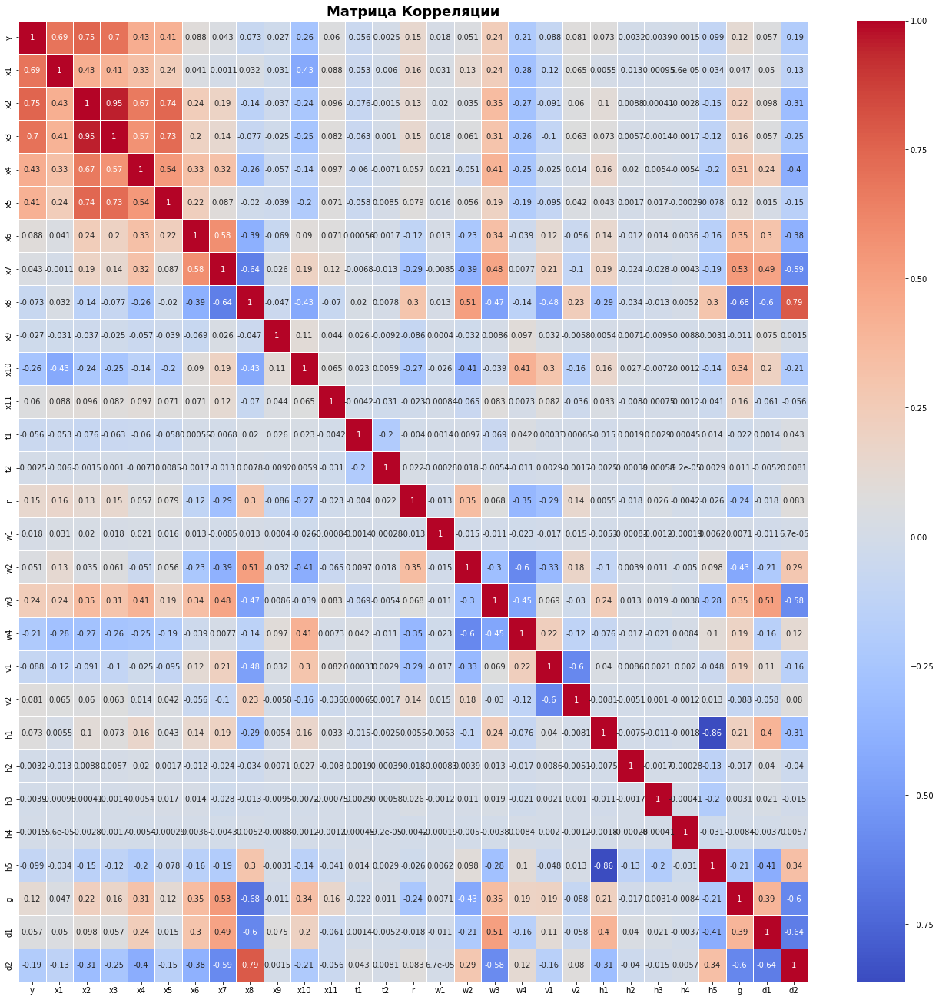

In [78]:
fig, ax = plt.subplots(figsize=(23, 23))
cols = ['y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 't1', 't2',
        'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']
hm = sns.heatmap(df_f[cols].corr(), cbar=True, annot=True, linewidth=0.7, cmap='coolwarm')
plt.title('Матрица Корреляции', fontsize=18, fontweight='bold')

Матрица корреляции без фиктивных переменных:

Text(0.5, 1.0, 'Матрица Корреляции')

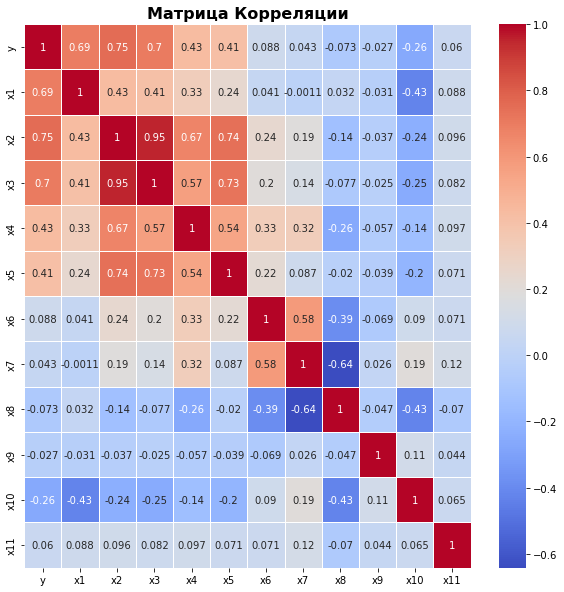

In [79]:
fig, ax = plt.subplots(figsize=(10, 10))
cols = ['y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11']
hm = sns.heatmap(df_f[cols].corr(), cbar=True, annot=True, linewidth=0.5, cmap='coolwarm')
plt.title('Матрица Корреляции', fontsize=16, fontweight='bold')

In [80]:
name_columns

,name,variable
0,№,-
1,published,-
2,price,y
3,price_by_meter,x1
4,area,x2
5,living_area,x3
6,kitchen_area,x4
7,rooms,x5
8,level,x6
9,max_levels,x7


Из матрицы корреляции видим что факторы x2 (площадь) и x3 (жилая площадь) явно коллинеарны (r=0.95), т. е. дублируют друг друга. Целесообразнее в анализ включить фактор x3 (хоть и коэффициент корреляции с целевой переменной у него меньше, чем у x2), т. к. корреляция с другими факторами (x4, x5) у него существенно меньше, чем у x2.

Также коллинеарны между собой факторы x5 (количество комнат) и x3 (жилая площадь) (r=0.73), целесообразно исключить фактор x5, так как корреляция и x5 и x3 с другими факторами примерно одинакова, но при этом корреляция x3 с целевой переменной y сильнее, чем корреляция x5 с y (ryx3=0.7 > ryx5=0.41).

НО!!!, все эти выводы основываются лишь только на статистике, а мы работаем с реальными данными, где нужно понимать, что такой фактор, как количество комнат очень значительный, и он очень сильно влияет на стоимость квартиры, и поэтому исключать его ни в коем случае нельзя. И факторы жилая площадь и количесвто комнат тесно связаны между собой и + есть фактор общая площадь, исходя из этого делаем вывод, что можно исключить лишь только фактор x3 (жилая площадь), а не факторы x2 и x5, как показала статистика.

Text(0.5, 1.0, 'Матрица Корреляции без x3 (и без фиктивных переменных)')

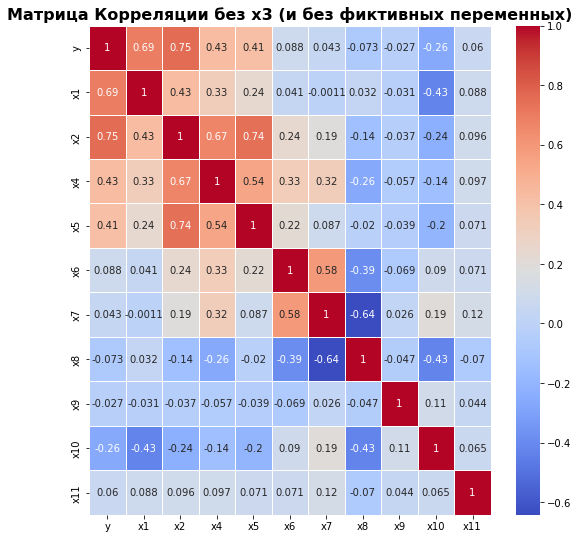

In [81]:
fig, ax = plt.subplots(figsize=(9, 9))
cols = ['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11']
hm = sns.heatmap(df_f[cols].corr(), cbar=True, annot=True, linewidth=0.5, cmap='coolwarm')
plt.title('Матрица Корреляции без x3 (и без фиктивных переменных)', fontsize=16, fontweight='bold')

Посмотрим на корреляцию факторов с целевой переменной y:

In [82]:
df_f.corr()[['y']].sort_values(by='y', ascending=False)

,y
y,1.000000
x2,0.751763
x3,0.698805
x1,0.693576
x4,0.434544
x5,0.413078
w3,0.237906
r,0.146333
g,0.121640
x6,0.088306


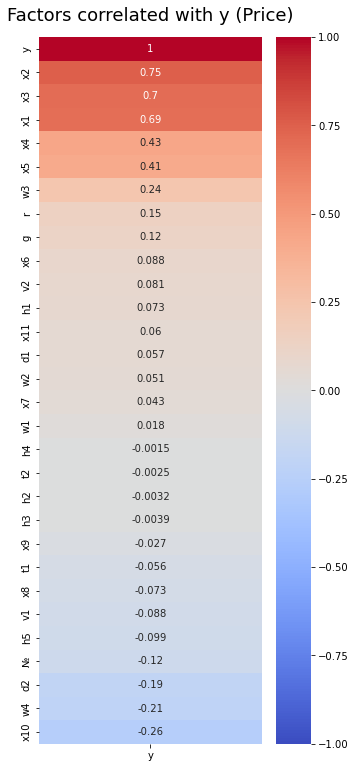

In [83]:
plt.figure(figsize=(5, 13))
heatmap = sns.heatmap(df_f.corr()[['y']].sort_values(by='y', ascending=False), vmin=-1, vmax=1, annot=True, cmap='coolwarm')

heatmap.set_title('Factors correlated with y (Price)', fontdict={'fontsize':18}, pad=16);

Построим для каждой количественной переменной гистограмму (с их помощью можно сделать выводы о распределении значений), а для каждой пары таких переменных – диаграмму рассеяния для того чтобы визуализировать матрицу корреляции:

Text(0.5, 0.98, 'Диаграмма рассеяния для визуализации матрицы корреляции')

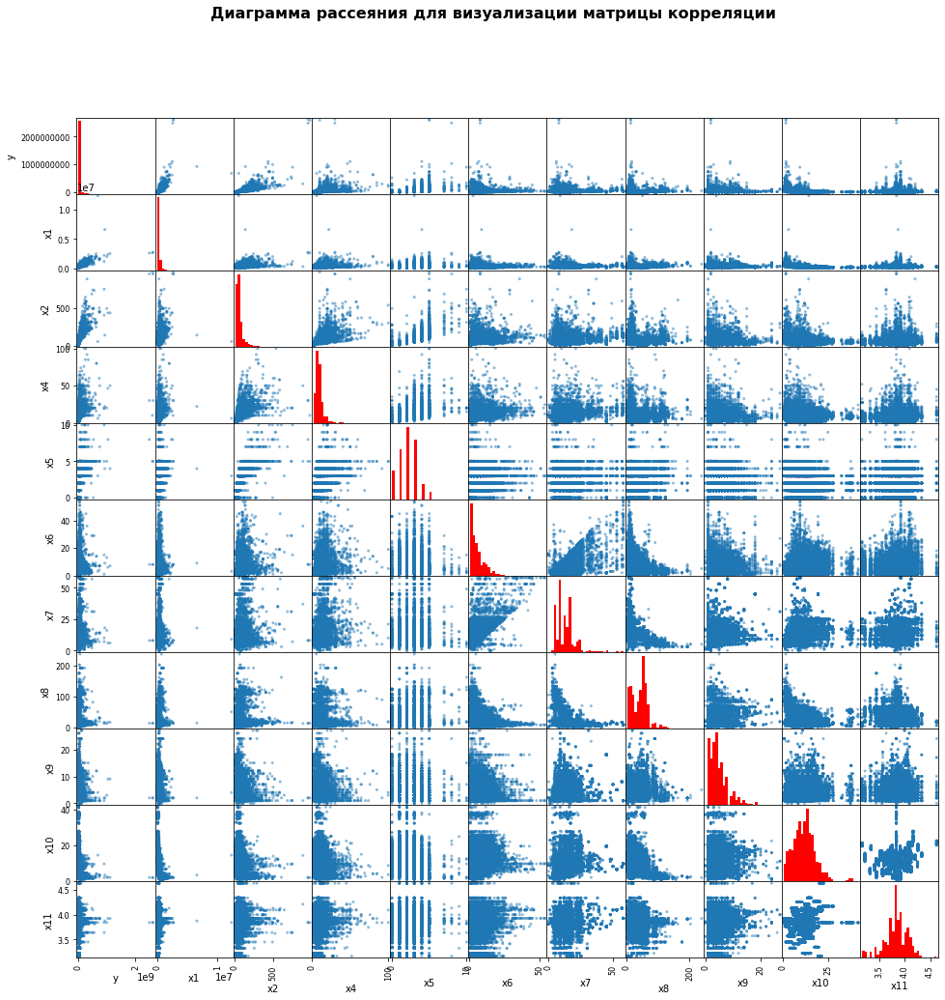

In [84]:
# без x3
cols = ['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11']
scatter_matrix(df_f[cols],  figsize=(16, 16), hist_kwds={'bins':30, 'color':'red'});
plt.suptitle('Диаграмма рассеяния для визуализации матрицы корреляции', fontsize=16, fontweight='bold')
# plt.savefig('Диаграмма рассеяния.png')

Из гистограмм видно, что у большинства переменных данные не имеют нормального распределния, а перекошены влево, что также может свидетельствовать о наличии выбросов и аномалий, соответствующих аномально большим значениям и при этом редко встречающимся. 

Ещё раз проверим данные на отсутствие пропусков:

In [85]:
for col in df_f.columns:
    pct_missing = np.mean(df_f[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

№ - 0%
published - 0%
y - 0%
x1 - 0%
x2 - 0%
x3 - 0%
x4 - 0%
x5 - 0%
x6 - 0%
x7 - 0%
x8 - 0%
x9 - 0%
x10 - 0%
x11 - 0%
t1 - 0%
t2 - 0%
r - 0%
w1 - 0%
w2 - 0%
w3 - 0%
w4 - 0%
v1 - 0%
v2 - 0%
h1 - 0%
h2 - 0%
h3 - 0%
h4 - 0%
h5 - 0%
g - 0%
d1 - 0%
d2 - 0%


Более подробно посмотрим на распределение целевой переменной и некоторых факторов:

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='y', ylabel='Density'>

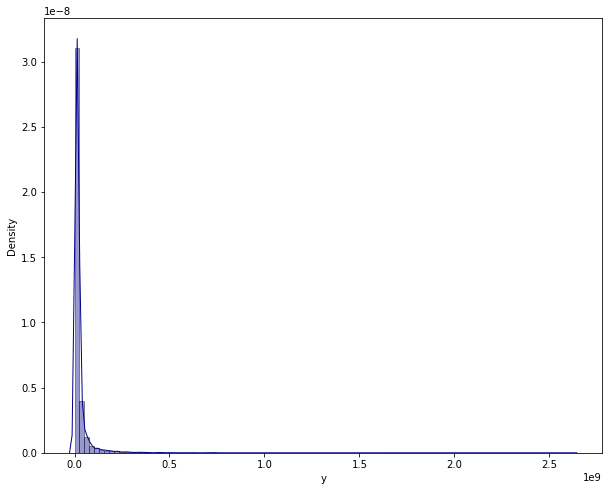

In [86]:
plt.figure(figsize=(10, 8))
plt.tight_layout()
seabornInstance.distplot(df_f['y'].dropna(), hist_kws={'edgecolor':'black'}, color = 'darkblue',
                            kde_kws={'linewidth': 1}, bins=int(500/5),)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='x2', ylabel='Density'>

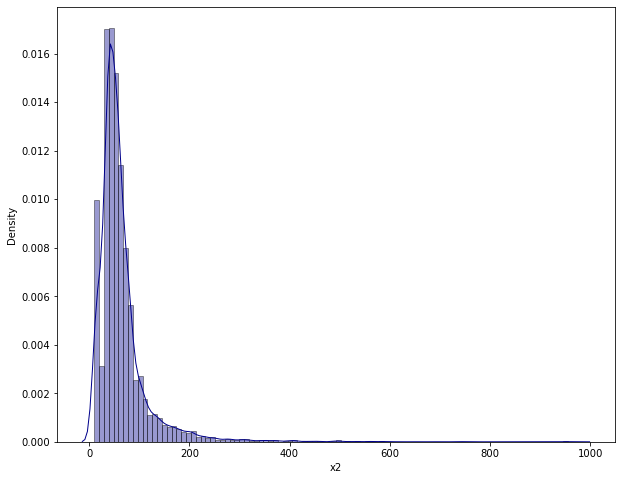

In [87]:
plt.figure(figsize=(10, 8))
plt.tight_layout()
seabornInstance.distplot(df_f['x2'].dropna(), hist_kws={'edgecolor':'black'}, color = 'darkblue',
                            kde_kws={'linewidth': 1}, bins=int(500/5),)

По гистограмме распределения целевой переменной y видно, наличие большого количества выбросов, которые нужно удалять, так как они негативно влияют на качество модели. НО сначала посторим линейную модель, не удаляя выбросы и посмотрим на её качество.

Для посторения моделей будем использовать библиотеку statsmodels.

In [88]:
df_f.describe()

,№,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,t1,t2,r,w1,w2,w3,w4,v1,v2,h1,h2,h3,h4,h5,g,d1,d2
count,15425.000000,1.542500e+04,1.542500e+04,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000,15425.000000
mean,7713.000000,2.604778e+07,3.319145e+05,63.989115,39.341018,9.571352,2.046159,6.364538,13.263533,42.264959,4.830729,11.979200,3.834764,0.996823,0.000130,0.215624,0.000583,0.281686,0.183274,0.477925,0.940097,0.022107,0.046483,0.001167,0.002593,0.000065,0.938282,0.520065,0.172707,0.665348
std,4452.958286,5.984272e+07,2.049370e+05,54.546735,35.695746,6.569037,1.278491,5.891278,7.977031,25.982821,3.511254,6.229280,0.223132,0.056274,0.011386,0.411268,0.024149,0.449835,0.386903,0.499529,0.237314,0.147036,0.210535,0.034142,0.050859,0.008052,0.240650,0.499613,0.378006,0.471884
min,1.000000,1.000000e+05,1.767000e+03,10.000000,5.000000,2.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.571863,3.168778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3857.000000,1.049000e+07,2.462960e+05,37.900000,19.500000,6.000000,1.000000,2.000000,9.000000,19.000000,2.000000,7.782712,3.734624,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,7713.000000,1.400000e+07,2.875000e+05,52.000000,31.000000,8.600000,2.000000,5.000000,12.000000,46.000000,4.000000,11.882122,3.841749,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
75%,11569.000000,2.161720e+07,3.493510e+05,74.000000,45.000000,10.700000,3.000000,9.000000,17.000000,58.000000,6.000000,15.509335,3.967912,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,15425.000000,2.618052e+09,1.228327e+07,975.000000,690.000000,100.000000,10.000000,54.000000,58.000000,238.000000,27.000000,41.683695,4.627057,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Множественная регрессия методом наименьших квадратов на всей выборке. Проверка основных статистик и критериев.

### Библиотека statsmodels

Перед обучением модели разделим разделим набор данных: 75% данных на обучающий набор, а 25% данных - на набор тестов.

Тестовые даннные - это данные, которые используемый для обучения алгоритм не видел. Модель обучалась на одних данных, а прогноз будет проводится на других данных (тестовых), эти данные были неизвестны при обучении, на них будет делаться прогноз и проверяться качество модели.

(X_train, y_train – это обучающая выборка, X_test, y_test – тестовая):

In [89]:
# определить результативную переменную
y = df_f['y']

# определить объясняющие переменные
X = df_f[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 't1', 't2',
        'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']]

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 
print ('Размеры выборок:\n обучающая - ', N_train, '\n тестовая - ', N_test)

Размеры выборок:
 обучающая -  11568 
 тестовая -  3857


Используем функцию OLS() из библиотеки statsmodels для выполнения обычной линейной регрессии методом наименьших квадратов. (статистику проведём без фактора x3).

In [91]:
# добавить константу в объясняющие переменные
X_train = sm.add_constant(X_train)

# подобрать модель линейной регрессии (обучение модели)
model = sm.OLS(y_train, X_train).fit()

# вывод результатов и статистик
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     2403.
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:23:25   Log-Likelihood:            -2.1139e+05
No. Observations:               11568   AIC:                         4.228e+05
Df Residuals:                   11540   BIC:                         4.230e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3.485e+07   5.69e+06     -6.128      0.000    -4.6e+07   -2.37e+07
x1           172.9514      1.434    120.592      0.000     170.140     175.763
x2          7.698e+05   6703.112    114.844      0.000    7.57e+05    7.83e+05
x4         -7.725e+05   4.33e+04    -17.844      0.000   -8.57e+05   -6.88e+05
x5         -7.279e+06   2.38e+05    -30.596      0.000   -7.75e+06   -6.81e+06
x6         -1.191e+05   4.19e+04     -2.844      0.004   -2.01e+05    -3.7e+04
x7         -2.974e+05   3.91e+04     -7.605      0.000   -3.74e+05   -2.21e+05
x8         -2.714e+05    1.9e+04    -14.289      0.000   -3.09e+05   -2.34e+05
x9         -8.679e+04   5.78e+04     -1.501      0.133      -2e+05    2.66e+04
x10         1.014e+06   4.35e+04     23.332      0.000    9.29e+05     1.1e+06
x11        -9.177e+06   9.14e+05    -10.043      0.000    -1.1e+07   -7.39e+06
t1          9.222e+06   3.72e+06      2.476      0.013    1.92e+06    1.65e+07
t2          1.701e+07   1.53e+07      1.113      0.266   -1.29e+07     4.7e+07
r           2.245e+06   5.58e+05      4.020      0.000    1.15e+06    3.34e+06
w1         -1.605e+07    8.6e+06     -1.866      0.062   -3.29e+07    8.08e+05
w2         -5.605e+06   9.47e+05     -5.920      0.000   -7.46e+06   -3.75e+06
w3         -9.134e+06    1.1e+06     -8.334      0.000   -1.13e+07   -6.99e+06
w4         -9.505e+04   9.08e+05     -0.105      0.917   -1.87e+06    1.68e+06
v1         -1.064e+06   1.28e+06     -0.833      0.405   -3.57e+06    1.44e+06
v2          7.974e+06   1.67e+06      4.765      0.000    4.69e+06    1.13e+07
h1          9.575e+06   2.04e+06      4.704      0.000    5.59e+06    1.36e+07
h2          3.647e+06    6.6e+06      0.553      0.581   -9.29e+06    1.66e+07
h3          6.088e+06   4.08e+06      1.492      0.136   -1.91e+06    1.41e+07
h4          6.611e+05    2.1e+07      0.031      0.975   -4.05e+07    4.18e+07
h5          6.093e+06   1.85e+06      3.297      0.001    2.47e+06    9.71e+06
g          -5.914e+06   5.93e+05     -9.972      0.000   -7.08e+06   -4.75e+06
d1          5.123e+05   7.76e+05      0.660      0.509   -1.01e+06    2.03e+06
d2           1.09e+07   8.43e+05     12.939      0.000    9.25e+06    1.26e+07
==============================================================================
Omnibus:                    31642.273   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):       2515031310.208
Skew:                          33.740   Prob(JB):                         0.00
Kurtosis:                    2286.277   Cond. No.                     4.08e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.08e+07. This might indi

Некоторые фиктивные переменные статистически незначимы по t-критерию, но возможно их незначимость обуславливается маленьким количеством экземпляров.

Проверим это, подсчитав количество экземпляров в фиктивных переменных:

In [92]:
dummies = ['t1', 't2', 'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']
for dummy in dummies:
   num_one = len(df_f[df_f[dummy] == 1])
   print('Кол-во экземпляров в ',dummy, ':', num_one) 

Кол-во экземпляров в  t1 : 15376
Кол-во экземпляров в  t2 : 2
Кол-во экземпляров в  r : 3326
Кол-во экземпляров в  w1 : 9
Кол-во экземпляров в  w2 : 4345
Кол-во экземпляров в  w3 : 2827
Кол-во экземпляров в  w4 : 7372
Кол-во экземпляров в  v1 : 14501
Кол-во экземпляров в  v2 : 341
Кол-во экземпляров в  h1 : 717
Кол-во экземпляров в  h2 : 18
Кол-во экземпляров в  h3 : 40
Кол-во экземпляров в  h4 : 1
Кол-во экземпляров в  h5 : 14473
Кол-во экземпляров в  g : 8022
Кол-во экземпляров в  d1 : 2664
Кол-во экземпляров в  d2 : 10263


Теория подтвердилась. Так как работа происходит с реальными данными, то удалять статистически незначимые фиктивные переменные не стоит, так как значения удалённых переменных перейдут в другие фиктивные переменные, и это повлияет на окончательный результат.

Сделаем прогноз на тестовых данных:

In [93]:
X_test = sm.add_constant(X_test)
y_test_pred = model.predict(X_test)
comparison_df = pd.DataFrame({'y Real (price)': y_test, 'y Predicted': y_test_pred})
comparison_df.head(40)

,y Real (price),y Predicted
12648,8890000.0,-1.057648e+07
7056,22150000.0,1.921827e+07
8330,12600000.0,5.388548e+06
14209,10400000.0,-4.092479e+06
3368,14900000.0,1.693951e+07
14233,14300000.0,1.115572e+07
8859,13900000.0,1.780184e+07
641,13750000.0,8.300416e+06
321,29000000.0,4.356543e+07
6907,15400000.0,5.809812e+06


Построим гистограмму, показывающую разницу между фактическим и прогнозируемым значением:

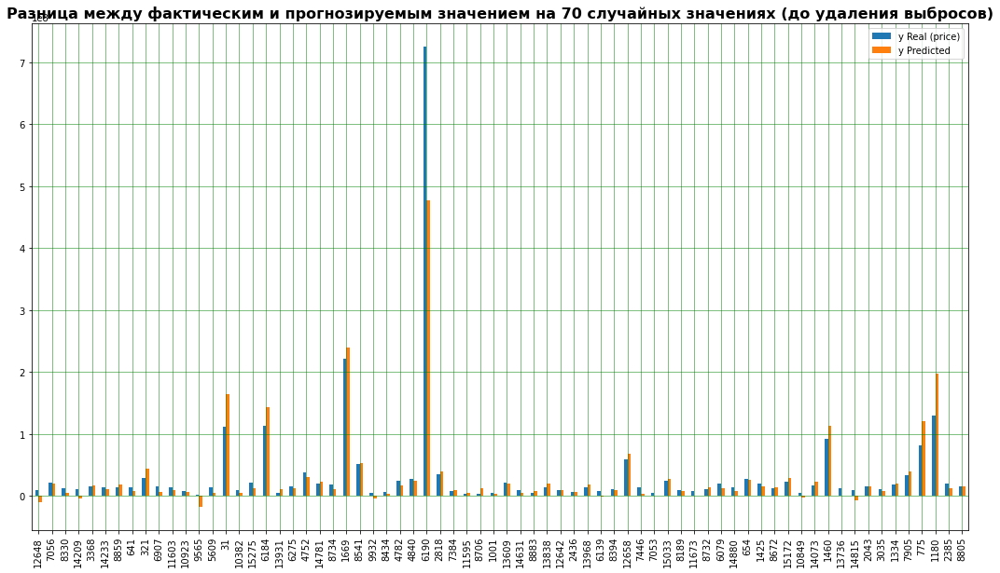

In [94]:
comparison_df.head(70).plot(kind='bar',figsize=(18,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Разница между фактическим и прогнозируемым значением на 70 случайных значениях (до удаления выбросов)', fontsize=16, fontweight='bold')
plt.show()

Вычислим коэффициент детерминации, среднеквадратичную ошибку и среднюю ошибку аппроксимации для тренировочных и тестовых данных:

In [95]:
y_train_pred = model.predict(X_train)

print('MSE train: {:.3f}, test: {:.3f}'.format(
        metrics.mean_squared_error(y_train, y_train_pred),
        metrics.mean_squared_error(y_test, y_test_pred)))
print('R^2 train: {:.3f}, test: {:.3f}'.format(
        metrics.r2_score(y_train, y_train_pred),
        metrics.r2_score(y_test, y_test_pred)))

MSE train: 435992651385120.375, test: 1891292447113122.000
R^2 train: 0.849, test: 0.666


Коэффициент детерминации на тестовой выборке составил всего 0.67, что не очень много.

Создадим функцию для рассчёта средней ошибки аппроксимации (MAPE):

In [96]:
def mape(actual, pred ): 
 actual, pred = np.array(actual), np.array(pred)
 return np.mean(np.abs((actual - pred) / actual)) * 100

In [97]:
print('Средняя ошибка аппроксимации (MAPE) в тестовой выборке: ', mape(y_test, y_test_pred), '%')
print('Средняя ошибка аппроксимации (MAPE) в обучающей выборке: ', mape(y_train, y_train_pred), '%')

Средняя ошибка аппроксимации (MAPE) в тестовой выборке:  53.303423745056655 %
Средняя ошибка аппроксимации (MAPE) в обучающей выборке:  57.80241173135593 %


Видим, что средняя ошибка аппроксимации очень велика, больше 10%.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='y', ylabel='Density'>

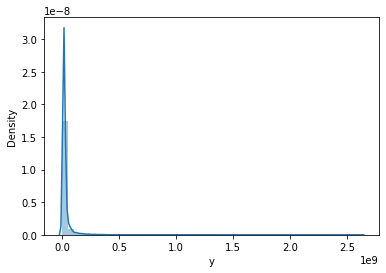

In [98]:
sns.distplot(df_f['y'].dropna())

## Использование межквартильного размаха для удаления выбросов

Удалять выбросы будем по целевой переменной y.

In [99]:
no_outliers = df_f

In [100]:
df_f.shape

(15425, 31)

Так как значения целевой переменной расположены с перекосом влево, то от нижней границы не будем отнимать межквартильное расстояние (IQR).

In [101]:
q3, q1 = np.percentile (no_outliers['y'], [75, 10])
IQR = q3 - q1
lower_bound = no_outliers['y'].quantile(0.1)
upper_bound = no_outliers['y'].quantile(0.75) + 1.5*IQR
print(lower_bound, upper_bound)
no_outliers = no_outliers[(no_outliers.y >= lower_bound) & (no_outliers.y <= upper_bound)]

5500000.0 45793000.0


In [102]:
no_outliers.shape

(12389, 31)

Видим, было удалено 3036 выбросов.

Построим диаграмму рассеяния с гистограммами распределения:

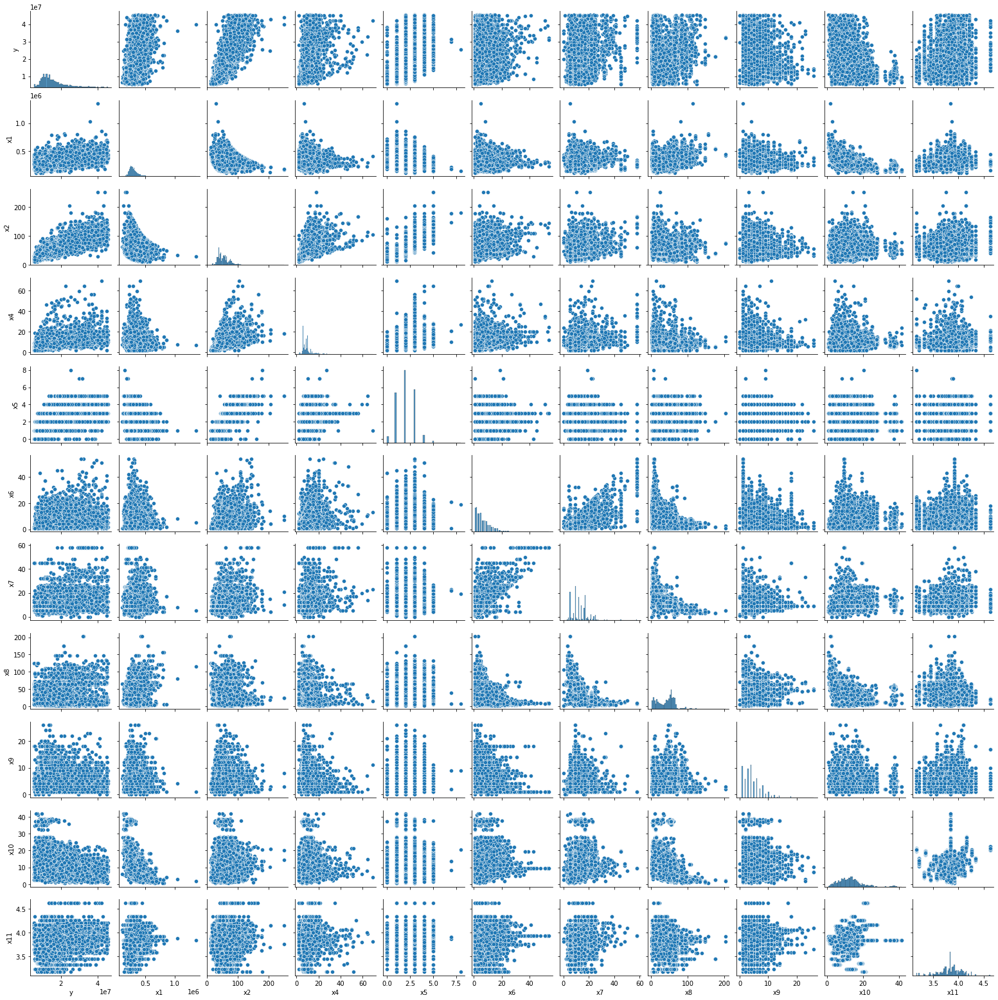

In [103]:
sns.pairplot(no_outliers[['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11']], height=2);

Из гистограмм видно, что все факторы и целевая переменная имеют распределение близкое к нормальному.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='y', ylabel='Density'>

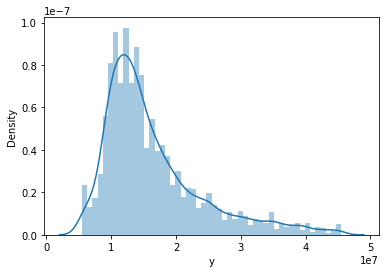

In [104]:
sns.distplot(no_outliers['y'].dropna())

Целевая переменная имеет нормальное распределение.

### Тест Граббса

Создадим функцию, которая проводит тест Граббса. Если вычисленное значение теста Граббса меньше критического при уровне значимости a=0.05, то принимается нулевая гипотеза и делается вывод, что выбросов нет.

НО данный тест можно использовать только на нормально распределённой выборке, а иначе его результаты будут недостоверны.

In [105]:
def grubbs_test(factor):
    n = len(factor)
    mean_factor = np.mean(factor)
    sd_factor = np.std(factor)
    numerator = max(abs(factor-mean_factor))
    g_calculated = numerator/sd_factor
    print("Grubbs Calculated Value:",g_calculated)
    t_value = stats.t.ppf(1 - 0.05 / (2 * n), n - 2)
    g_critical = ((n - 1) * np.sqrt(np.square(t_value))) / (np.sqrt(n) * np.sqrt(n - 2 + np.square(t_value)))
    print("Grubbs Critical Value:",g_critical)

In [106]:
columns = no_outliers[['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 't1', 't2',
        'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']]
for column in columns:
    print(column + ':'), grubbs_test(no_outliers[column]), print('\t')

y:
Grubbs Calculated Value: 3.8053165525962482
Grubbs Critical Value: 4.607645091920924
	
x1:
Grubbs Calculated Value: 13.076997842561578
Grubbs Critical Value: 4.607645091920924
	
x2:
Grubbs Calculated Value: 8.644584576589795
Grubbs Critical Value: 4.607645091920924
	
x4:
Grubbs Calculated Value: 13.635028529530597
Grubbs Critical Value: 4.607645091920924
	
x5:
Grubbs Calculated Value: 6.2140527222256
Grubbs Critical Value: 4.607645091920924
	
x6:
Grubbs Calculated Value: 8.535732444016393
Grubbs Critical Value: 4.607645091920924
	
x7:
Grubbs Calculated Value: 6.266253803024925
Grubbs Critical Value: 4.607645091920924
	
x8:
Grubbs Calculated Value: 6.695522608461952
Grubbs Critical Value: 4.607645091920924
	
x9:
Grubbs Calculated Value: 6.343247036381619
Grubbs Critical Value: 4.607645091920924
	
x10:
Grubbs Calculated Value: 4.745219514762264
Grubbs Critical Value: 4.607645091920924
	
x11:
Grubbs Calculated Value: 3.5525588316941894
Grubbs Critical Value: 4.607645091920924
	
t1:
Gru

Значение теста для целевой переменной меньше критического, что говорит об отсутствии выбросов. Значение теста Граббса у факторов близко к критическому, что тоже очень хорошо, для реальных данных, также нужно учитывать что данные имеют не совсем нормальное распределение.

## Построение модели множественной регрессии на данных без выбросов

In [107]:
Y2 = no_outliers['y']

X2 = no_outliers[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 't1', 't2',
        'r', 'w1', 'w2', 'w3', 'w4', 'v1', 'v2', 'h1', 'h2', 'h3', 'h4', 'h5', 'g', 'd1', 'd2']]

In [108]:
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(X2, Y2, test_size=0.25, random_state=0)

N_train, _ = X_train2.shape 
N_test,  _ = X_test2.shape 
print ('Размеры выборок:\n обучающая - ', N_train, '\n тестовая - ', N_test)

Размеры выборок:
 обучающая -  9291 
 тестовая -  3098


In [109]:
X_train2 = sm.add_constant(X_train2)
model_no_outliers = sm.OLS(Y_train2, X_train2).fit()

model_no_outliers.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     6022.
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:24:23   Log-Likelihood:            -1.4682e+05
No. Observations:                9291   AIC:                         2.937e+05
Df Residuals:                    9263   BIC:                         2.939e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.503e+07   6.07e+05    -24.758      0.000   -1.62e+07   -1.38e+07
x1            54.3616      0.314    173.071      0.000      53.746      54.977
x2          2.662e+05   1913.147    139.132      0.000    2.62e+05     2.7e+05
x4          4.546e+04   5517.010      8.239      0.000    3.46e+04    5.63e+04
x5          3.734e+05   3.85e+04      9.692      0.000    2.98e+05    4.49e+05
x6         -9114.0548   4113.733     -2.216      0.027   -1.72e+04   -1050.233
x7          1.022e+04   4427.871      2.308      0.021    1539.264    1.89e+04
x8         -5657.4148   2109.489     -2.682      0.007   -9792.477   -1522.353
x9          3.111e+04   5688.036      5.469      0.000       2e+04    4.23e+04
x10        -1.448e+04   4504.044     -3.215      0.001   -2.33e+04   -5653.755
x11         4.434e+04   8.75e+04      0.507      0.612   -1.27e+05    2.16e+05
t1          5.091e+05   4.19e+05      1.215      0.224   -3.12e+05    1.33e+06
t2          7.225e+05   1.32e+06      0.546      0.585   -1.87e+06    3.32e+06
r          -6.261e+04   5.42e+04     -1.155      0.248   -1.69e+05    4.37e+04
w1          3.343e+06   1.02e+06      3.264      0.001    1.34e+06    5.35e+06
w2          1.289e+05   8.52e+04      1.514      0.130    -3.8e+04    2.96e+05
w3          4.684e+05   1.03e+05      4.527      0.000    2.66e+05    6.71e+05
w4           1.19e+04   7.99e+04      0.149      0.882   -1.45e+05    1.69e+05
v1         -5.968e+05   1.27e+05     -4.699      0.000   -8.46e+05   -3.48e+05
v2          3.369e+05   1.75e+05      1.926      0.054   -5932.006     6.8e+05
h1         -8.909e+05   2.34e+05     -3.814      0.000   -1.35e+06   -4.33e+05
h2         -1.061e+06   5.57e+05     -1.904      0.057   -2.15e+06    3.11e+04
h3          1.081e+04   3.85e+05      0.028      0.978   -7.44e+05    7.66e+05
h4         -7.514e+05   1.78e+06     -0.422      0.673   -4.24e+06    2.74e+06
h5         -7.829e+05    2.2e+05     -3.562      0.000   -1.21e+06   -3.52e+05
g          -2.347e+04   5.78e+04     -0.406      0.685   -1.37e+05    8.98e+04
d1         -4.329e+05   7.88e+04     -5.496      0.000   -5.87e+05   -2.79e+05
d2          6.356e+04   8.03e+04      0.792      0.428   -9.38e+04    2.21e+05
==============================================================================
Omnibus:                     5099.450   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           202267.526
Skew:                          -1.983   Prob(JB):                         0.00
Kurtosis:                      25.511   Cond. No.                     2.99e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.99e+07. This might indi

In [110]:
name_columns

,name,variable
0,№,-
1,published,-
2,price,y
3,price_by_meter,x1
4,area,x2
5,living_area,x3
6,kitchen_area,x4
7,rooms,x5
8,level,x6
9,max_levels,x7


In [111]:
# прогноз на тестовых данных

X_test2 = sm.add_constant(X_test2)
Y_test_pred2 = model_no_outliers.predict(X_test2)
comparison_real_and_prediction = pd.DataFrame({'y Real (price)': Y_test2, 'y Predicted': Y_test_pred2})
comparison_real_and_prediction.head(40)

,y Real (price),y Predicted
13686,14100000.0,1.464365e+07
1903,34500000.0,3.071468e+07
3022,14650000.0,1.469458e+07
5047,11999999.0,1.159239e+07
12173,9900000.0,9.167639e+06
3223,10000000.0,9.167935e+06
3135,22000000.0,2.169091e+07
12268,13450000.0,1.308832e+07
12624,19000000.0,1.974767e+07
8897,24000000.0,2.682896e+07


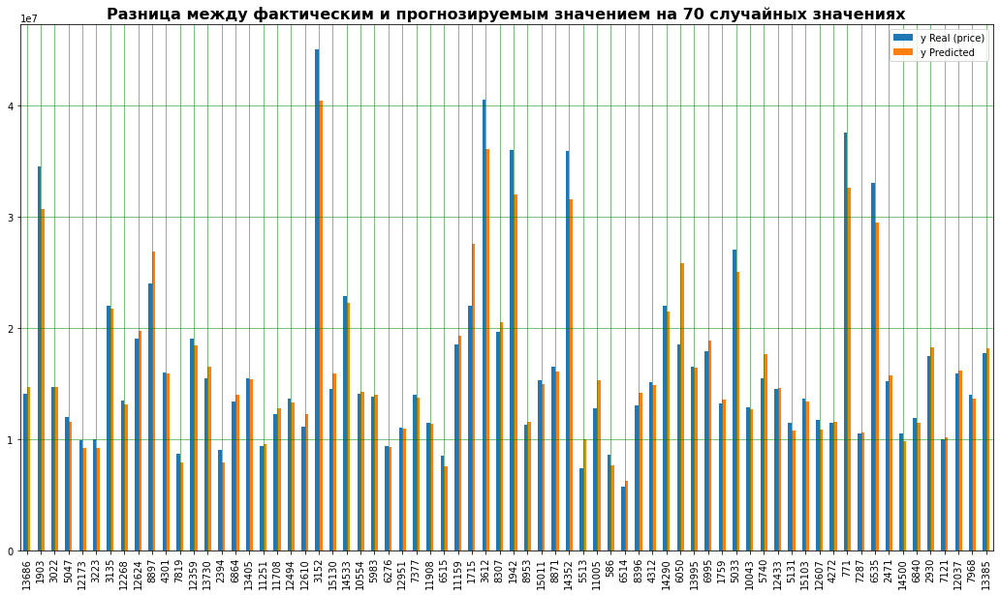

In [112]:
comparison_real_and_prediction.head(70).plot(kind='bar',figsize=(18,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Разница между фактическим и прогнозируемым значением на 70 случайных значениях', fontsize=16, fontweight='bold')
plt.show()

In [113]:
Y_train_pred2 = model_no_outliers.predict(X_train2)

In [114]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, median_absolute_error, r2_score

print('MSE train: {:.3f}, test: {:.3f}'.format(
        mean_squared_error(Y_train2, Y_train_pred2),
        mean_squared_error(Y_test2, Y_test_pred2)))
print('R^2 train: {:.3f}, test: {:.3f}'.format(
        r2_score(Y_train2, Y_train_pred2),
        r2_score(Y_test2, Y_test_pred2)))

MSE train: 3114894229812.671, test: 2882175211235.577
R^2 train: 0.946, test: 0.953


In [115]:
print('Средняя ошибка аппроксимации (MAPE) в тестовой выборке: ', mape(Y_test2, Y_test_pred2), '%')
print('Средняя ошибка аппроксимации (MAPE) в обучающей выборке: ', mape(Y_train2, Y_train_pred2), '%')

Средняя ошибка аппроксимации (MAPE) в тестовой выборке:  6.677240757144219 %
Средняя ошибка аппроксимации (MAPE) в обучающей выборке:  6.683948330506702 %


## Вывод:

Линейная модель построенная на данных без выбросов методом наименьших квадратов (МНК) получилась весьма точной, из гистограммы видно, что модель хорошо предсказывает значения:   
Средняя оошибка аппроксимации = 6.7%   
Коэффициент детерминации = 0.95   
По F-критерию Фишера модель является статистически значимой.  
НО в модели присутствует очень много статистически незначимых факторов (среди фиктивных переменных), попробуем построить модель без этих факторов и посмотрим на результат.

## Модель БЕЗ статистически незначимых факторов

In [116]:
# h1, x8, x5 (x7)
Y_stat = no_outliers['y']

X_stat = no_outliers[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']]

In [117]:
X_train_stat, X_test_stat, Y_train_stat, Y_test_stat = train_test_split(X_stat, Y_stat, test_size=0.25, random_state=0)

In [118]:
X_train_stat = sm.add_constant(X_train_stat)
model_stat = sm.OLS(Y_train_stat, X_train_stat).fit()

model_stat.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                 1.083e+04
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:25:26   Log-Likelihood:            -1.4683e+05
No. Observations:                9291   AIC:                         2.937e+05
Df Residuals:                    9275   BIC:                         2.938e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.438e+07   2.78e+05    -51.808      0.000   -1.49e+07   -1.38e+07
x1            54.4536      0.294    185.099      0.000      53.877      55.030
x2          2.667e+05   1804.611    147.770      0.000    2.63e+05     2.7e+05
x4          4.485e+04   5503.514      8.150      0.000    3.41e+04    5.56e+04
x5          3.674e+05   3.71e+04      9.894      0.000    2.95e+05     4.4e+05
x6         -9320.5414   4100.842     -2.273      0.023   -1.74e+04   -1281.989
x7          9862.1483   4271.917      2.309      0.021    1488.252    1.82e+04
x8         -4085.8347   1499.312     -2.725      0.006   -7024.816   -1146.853
x9          3.253e+04   5556.121      5.856      0.000    2.16e+04    4.34e+04
x10        -1.557e+04   4277.653     -3.640      0.000    -2.4e+04   -7187.249
w1          3.289e+06   1.02e+06      3.219      0.001    1.29e+06    5.29e+06
w3          4.166e+05    6.8e+04      6.129      0.000    2.83e+05     5.5e+05
v1         -7.023e+05   9.96e+04     -7.053      0.000   -8.98e+05   -5.07e+05
h1         -7.692e+05    1.9e+05     -4.043      0.000   -1.14e+06   -3.96e+05
h5         -6.731e+05   1.72e+05     -3.912      0.000   -1.01e+06   -3.36e+05
d1         -4.415e+05   7.45e+04     -5.929      0.000   -5.87e+05   -2.95e+05
==============================================================================
Omnibus:                     5141.835   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           207501.365
Skew:                          -2.002   Prob(JB):                         0.00
Kurtosis:                      25.803   Cond. No.                     1.71e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.71e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [119]:
#name_columns[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']]
name_columns.loc[name_columns['variable']. isin(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1'])]

,name,variable
3,price_by_meter,x1
4,area,x2
6,kitchen_area,x4
7,rooms,x5
8,level,x6
9,max_levels,x7
10,build_age,x8
11,enterances,x9
12,remoute_from_center,x10
17,walls_Дерево,w1


In [120]:
X_test_stat = sm.add_constant(X_test_stat)

# прогноз на тестовых данных
Y_test_pred_stat = model_stat.predict(X_test_stat)
comparison_stat = pd.DataFrame({'y Real (price)': Y_test_stat, 'y Predicted': Y_test_pred_stat})
comparison_stat.head(40)

,y Real (price),y Predicted
13686,14100000.0,1.465157e+07
1903,34500000.0,3.066987e+07
3022,14650000.0,1.470091e+07
5047,11999999.0,1.159176e+07
12173,9900000.0,9.139974e+06
3223,10000000.0,9.078953e+06
3135,22000000.0,2.169762e+07
12268,13450000.0,1.309654e+07
12624,19000000.0,1.976301e+07
8897,24000000.0,2.688350e+07


In [121]:
Y_train_pred_stat = model_stat.predict(X_train_stat)

In [122]:
print('MSE train: {:.3f}, test: {:.3f}'.format(
        mean_squared_error(Y_train_stat, Y_train_pred_stat),
        mean_squared_error(Y_test_stat, Y_test_pred_stat)))
print('R^2 train: {:.3f}, test: {:.3f}'.format(
        r2_score(Y_train_stat, Y_train_pred_stat),
        r2_score(Y_test_stat, Y_test_pred_stat)))

MSE train: 3120094450548.037, test: 2886148321192.302
R^2 train: 0.946, test: 0.953


In [123]:
print('Средняя ошибка аппроксимации (MAPE) в тестовой выборке: ', mape(Y_test_stat, Y_test_pred_stat), '%')
print('Средняя ошибка аппроксимации (MAPE) в обучающей выборке: ', mape(Y_train_stat, Y_train_pred_stat), '%')

Средняя ошибка аппроксимации (MAPE) в тестовой выборке:  6.669942779635867 %
Средняя ошибка аппроксимации (MAPE) в обучающей выборке:  6.672159868509402 %


После удаления факторов модель осталась такой же качественной, но при этом мы избавились от ненужных факторов.

## Проверка предпосылок МНК

### 1. Случайный характер остатков

Посчитаем остатки:

In [124]:
E = comparison_stat['y Real (price)'] - comparison_stat['y Predicted']
real_and_prediction_and_E = comparison_stat
real_and_prediction_and_E.insert(2, 'residuals (E)', E)

In [125]:
real_and_prediction_and_E.head()

,y Real (price),y Predicted,residuals (E)
13686,14100000.0,1.465157e+07,-5.515725e+05
1903,34500000.0,3.066987e+07,3.830129e+06
3022,14650000.0,1.470091e+07,-5.090679e+04
5047,11999999.0,1.159176e+07,4.082397e+05
12173,9900000.0,9.139974e+06,7.600262e+05


In [126]:
real_and_prediction_and_E.shape

(3098, 3)

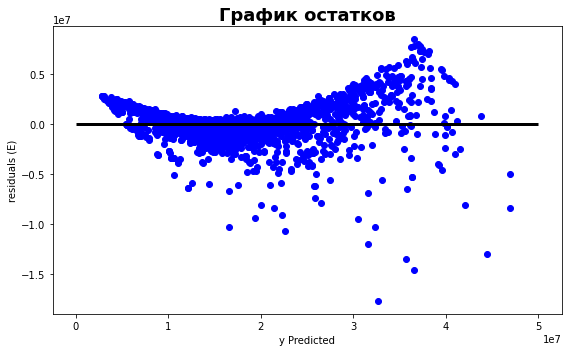

In [127]:
plt.figure(figsize=(8,5))
plt.scatter(real_and_prediction_and_E['y Predicted'],  real_and_prediction_and_E['residuals (E)'],
            c='blue', marker='o')
plt.xlabel('y Predicted')
plt.ylabel('residuals (E)')
plt.hlines(y=0, xmin=0, xmax=50000000, lw=3, color='black')
plt.title('График остатков', fontsize=18, fontweight='bold')
plt.tight_layout()

ВЫВОД: Остатки не случайны.

### 2. Нулевая средняя величина остатков не зависящая от Xi

In [481]:
sum(model_stat.resid)

-4.204455763101578e-05

In [128]:
model_stat.resid.mean()

-4.525299497472369e-09

In [129]:
Xi_and_residuals = X_test_stat[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']].copy()

In [130]:
Xi_and_residuals.insert(9, 'residuals (E)', real_and_prediction_and_E['residuals (E)'])

In [131]:
Xi_and_residuals.head()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,residuals (E)
13686,219969.0,64.1,7.2,3,2,12,52,9,17.328237,-5.515725e+05
1903,410714.0,84.0,19.7,2,13,17,19,5,5.761526,3.830129e+06
3022,314378.0,46.6,9.0,2,5,12,51,1,7.957394,-5.090679e+04
5047,266667.0,45.0,7.0,2,1,9,56,4,13.069464,4.082397e+05
12173,264706.0,37.4,8.5,1,12,17,33,5,20.845004,7.600262e+05


In [132]:
Xi_and_residuals.shape

(3098, 10)

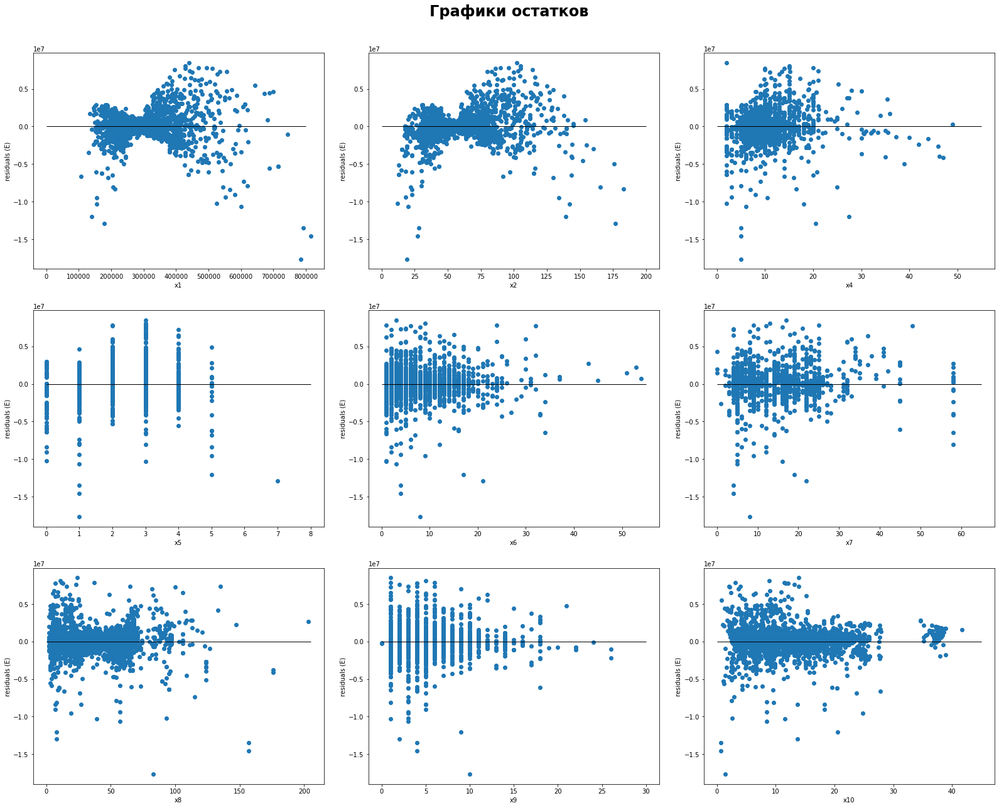

In [133]:
fig, ax = plt.subplots(nrows=3, ncols=3, sharey=False, figsize=(22, 18))
fig. tight_layout (h_pad = 5, w_pad = 4)

ax[0, 0].scatter(Xi_and_residuals['x1'], Xi_and_residuals['residuals (E)'])
ax[0, 0].set(ylabel = 'residuals (E)', xlabel = 'x1')
ax[0, 0].hlines(y=0, xmin=0, xmax=800000, lw=1, color='black')
ax[0, 1].scatter(Xi_and_residuals['x2'], Xi_and_residuals['residuals (E)'])
ax[0, 1].set(ylabel = 'residuals (E)', xlabel = 'x2')
ax[0, 1].hlines(y=0, xmin=0, xmax=200, lw=1, color='black')
ax[0, 2].scatter(Xi_and_residuals['x4'], Xi_and_residuals['residuals (E)'])
ax[0, 2].set(ylabel = 'residuals (E)', xlabel = 'x4')
ax[0, 2].hlines(y=0, xmin=0, xmax=55, lw=1, color='black')
ax[1, 0].scatter(Xi_and_residuals['x5'], Xi_and_residuals['residuals (E)'])
ax[1, 0].set(ylabel = 'residuals (E)', xlabel = 'x5')
ax[1, 0].hlines(y=0, xmin=0, xmax=8, lw=1, color='black')
ax[1, 1].scatter(Xi_and_residuals['x6'], Xi_and_residuals['residuals (E)'])
ax[1, 1].set(ylabel = 'residuals (E)', xlabel = 'x6')
ax[1, 1].hlines(y=0, xmin=0, xmax=55, lw=1, color='black')
ax[1, 2].scatter(Xi_and_residuals['x7'], Xi_and_residuals['residuals (E)'])
ax[1, 2].set(ylabel = 'residuals (E)', xlabel = 'x7')
ax[1, 2].hlines(y=0, xmin=0, xmax=65, lw=1, color='black')
ax[2, 0].scatter(Xi_and_residuals['x8'], Xi_and_residuals['residuals (E)'])
ax[2, 0].set(ylabel = 'residuals (E)', xlabel = 'x8')
ax[2, 0].hlines(y=0, xmin=0, xmax=205, lw=1, color='black')
ax[2, 1].scatter(Xi_and_residuals['x9'], Xi_and_residuals['residuals (E)'])
ax[2, 1].set(ylabel = 'residuals (E)', xlabel = 'x9')
ax[2, 1].hlines(y=0, xmin=0, xmax=30, lw=1, color='black')
ax[2, 2].scatter(Xi_and_residuals['x10'], Xi_and_residuals['residuals (E)'])
ax[2, 2].set(ylabel = 'residuals (E)', xlabel = 'x10')
ax[2, 2].hlines(y=0, xmin=0, xmax=45, lw=1, color='black')


fig.suptitle('Графики остатков', fontsize=24, fontweight='bold')
plt.subplots_adjust(top = 0.92)

ВЫВОД: Остатки зависят от значений Xi.

### 3. Гомоскедастичность остатков

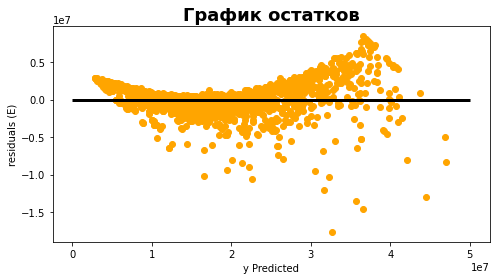

In [134]:
plt.figure(figsize=(7,4))
plt.scatter(real_and_prediction_and_E['y Predicted'],  real_and_prediction_and_E['residuals (E)'],
            c='orange', marker='o')
plt.xlabel('y Predicted')
plt.ylabel('residuals (E)')
plt.hlines(y=0, xmin=0, xmax=50000000, lw=3, color='black')
plt.title('График остатков', fontsize=18, fontweight='bold')
plt.tight_layout()

ВЫВОД: Отсутствует гомоскедастичность остатков, имеет место гетероскедастичность (далее это будет проверено с помощью тестов).

### 4. Отсутствие автокорреляции остатков

In [135]:
from statsmodels.stats.stattools import durbin_watson

durbin_watson(model_stat.resid)

2.0396814646718195

ВЫВОД: АВТОКОРРЕЛЯЦИИ ОСТАТКОВ НЕТ. Статистика теста — 2,04.Поскольку это практически равно 2 (и находится в диапазоне от 1,5 до 2,5) считаем, что автокорреляция не вызывает проблем в этой регрессионной модели.

### 5. Остатки подчиняются нормальному распределению

График QQ - «квантильный-квантильный» график:

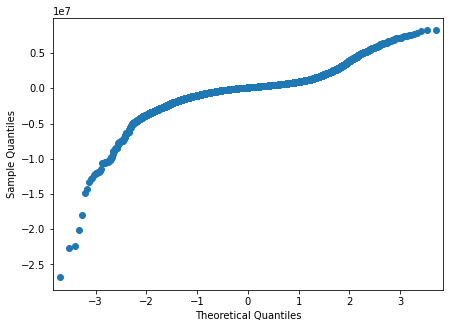

In [136]:
res = model_stat.resid
fig = sm.qqplot(res)
fig.set_size_inches(7, 5)
plt.show()

ВЫВОД: Остатки не имеют нормального распределения.

# Выявление и коррекция гетероскедастичности с помощью тестов Уайта и Голдфельда - Квандта

### Тест Голдфельда-Квандта

In [138]:
from statsmodels.stats.diagnostic import het_goldfeldquandt

In [139]:
def Goldfeld_Quandt_test(
    model_fit,
    p_level: float=0.95,
    model_name=''):
    
    a_level = 1 - p_level
    
    # реализация теста
    test = het_goldfeldquandt(model_fit.resid, model_fit.model.exog)
    test_result = lzip(['F_statistic', 'p_calc'], test)    # распаковка результатов теста
    # расчетное значение статистики F-критерия
    F_calc_tuple = test_result[0]
    F_statistic = F_calc_tuple[1]
    # расчетный уровень значимости
    p_calc_tuple = test_result[1]
    p_calc = p_calc_tuple[1]
    # вывод
    conclusion_test = 'heteroscedasticity' if p_calc < a_level else 'not heteroscedasticity'
    
    result = pd.DataFrame({
        'test': ('Goldfeld–Quandt test'),
        'p_level': (p_level),
        'a_level': (a_level),
        'F_statistic': (F_statistic),
        'p_calc': (p_calc),
        'p_calc < a_level': (p_calc < a_level),
        'heteroscedasticity_check': (conclusion_test)
        },
        index=[model_name])
    
    return result

In [140]:
Goldfeld_Quandt_test(model_stat, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Goldfeld–Quandt test,0.95,0.05,1.337863,2.429721e-23,True,heteroscedasticity


### Тест Уайта

In [141]:
from statsmodels.stats.diagnostic import het_white

# тест Уайта с помощью библиотеки statsmodels
white_test = het_white(model_stat.resid, model_stat.model.exog)

# метки
labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

print(dict(zip(labels, white_test)))

AssertionError: 

Провести тест Уайта не удаётся, поэтому проведём тест Бреуша-Пагана:

### Тест Бреуша-Пагана

In [142]:
from statsmodels.stats.diagnostic import het_breuschpagan

def Breush_Pagan_test(
    model_fit,
    p_level: float=0.95,
    model_name=''):
    
    a_level = 1 - p_level
    
    # реализация теста
    test = het_breuschpagan(model_fit.resid, model_fit.model.exog)
    name = ['Lagrange_multiplier_statistic', 'p_calc_LM', 'F_statistic', 'p_calc']
    test_result = lzip(name, test)    # распаковка результатов теста
    # расчетное значение статистики теста множителей Лагранжа
    LM_calc_tuple = test_result[0]
    Lagrange_multiplier_statistic = LM_calc_tuple[1]
    # расчетный уровень значимости статистики теста множителей Лагранжа
    p_calc_LM_tuple = test_result[1]
    p_calc_LM = p_calc_LM_tuple[1]
    # расчетное значение F-статистики гипотезы о том, что дисперсия ошибки не зависит от x
    F_calc_tuple = test_result[2]
    F_statistic = F_calc_tuple[1]
    # расчетный уровень значимости F-статистики
    p_calc_tuple = test_result[3]
    p_calc = p_calc_tuple[1]
    # вывод
    conclusion_test = 'heteroscedasticity' if p_calc < a_level else 'not heteroscedasticity'

    # вывод
    conclusion_test = 'heteroscedasticity' if p_calc < a_level else 'not heteroscedasticity'
    
    result = pd.DataFrame({
        'test': ('Breush-Pagan test'),
        'p_level': (p_level),
        'a_level': (a_level),
        'Lagrange_multiplier_statistic': (Lagrange_multiplier_statistic),
        'p_calc_LM': (p_calc_LM),
        'p_calc_LM < a_level': (p_calc_LM < a_level),
        'F_statistic': (F_statistic),
        'p_calc': (p_calc),
        'p_calc < a_level': (p_calc < a_level),
        'heteroscedasticity_check': (conclusion_test)
        },
        index=[model_name])
    
    return result

In [143]:
Breush_Pagan_test(model_stat, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Breush-Pagan test,0.95,0.05,1629.12502,0.0,True,131.474646,0.0,True,heteroscedasticity


#### ВЫВОД:    
Тесты Голдфельда-Квандта и Бреуша-Пагана показали наличие гетероскедастичности остатков.

## Построение модели множественной регрессии взвешенным методом наименьших квадратов (ВМНК) (weighted least squares, WLS)

#### Определение веса для использования ВМНК

In [144]:
# Регрессировать абсолютные значения остатков по подобранным значениям
# Сохраняем абсолютные значения остатков модели МНК
y_resid = [abs(resid) for resid in model_stat.resid]

# Добавить константу в соответствии с документацией statsmodels к подогнанным значениям
X_resid = sm.add_constant(model_stat.fittedvalues)

# Создать модель OLS, подогнать и распечатать результаты
mod_resid = sm.OLS(y_resid, X_resid).fit()

mod_fv = mod_resid.fittedvalues

# Вычисление весов
weight_ = 1 / (mod_fv**2)
weight_

2128     6.846580e-13
11760    1.186129e-12
3886     6.076113e-11
6537     1.744764e-12
14510    3.111242e-12
6478     6.287699e-11
12685    1.329309e-13
1272     1.221916e-13
4966     1.489866e-12
8674     6.110555e-12
8407     1.120385e-12
4079     7.351576e-12
7659     9.763697e-13
9696     7.855246e-12
12179    3.192573e-13
990      5.398425e-12
7041     5.776875e-12
13429    1.820479e-11
7998     8.814630e-13
13230    6.540998e-12
6153     6.491644e-13
201      1.157682e-12
3928     1.206884e-12
8204     1.986662e-13
12364    2.679761e-12
6450     3.077230e-12
7582     3.634229e-12
12697    3.420291e-12
11763    2.024666e-12
1413     2.256739e-13
4664     5.121243e-13
10724    4.292774e-13
14147    1.832239e-12
12182    8.836564e-12
4620     8.188557e-12
896      3.456945e-13
8524     6.621737e-13
4829     5.656819e-12
4639     6.563283e-13
270      2.784577e-11
907      6.382089e-12
5214     1.082617e-12
717      1.014403e-12
10734    2.715785e-12
7948     2.002526e-13
5871     1

In [500]:
# 2-ой способ определения весовых коэффициентов
data = X_train_stat

wt = 1 / smf.ols('model_stat.resid.abs() ~ model_stat.fittedvalues', data=data).fit().fittedvalues**2

wt

2128     6.846580e-13
11760    1.186129e-12
3886     6.076113e-11
6537     1.744764e-12
14510    3.111242e-12
6478     6.287699e-11
12685    1.329309e-13
1272     1.221916e-13
4966     1.489866e-12
8674     6.110555e-12
8407     1.120385e-12
4079     7.351576e-12
7659     9.763697e-13
9696     7.855246e-12
12179    3.192573e-13
990      5.398425e-12
7041     5.776875e-12
13429    1.820479e-11
7998     8.814630e-13
13230    6.540998e-12
6153     6.491644e-13
201      1.157682e-12
3928     1.206884e-12
8204     1.986662e-13
12364    2.679761e-12
6450     3.077230e-12
7582     3.634229e-12
12697    3.420291e-12
11763    2.024666e-12
1413     2.256739e-13
4664     5.121243e-13
10724    4.292774e-13
14147    1.832239e-12
12182    8.836564e-12
4620     8.188557e-12
896      3.456945e-13
8524     6.621737e-13
4829     5.656819e-12
4639     6.563283e-13
270      2.784577e-11
907      6.382089e-12
5214     1.082617e-12
717      1.014403e-12
10734    2.715785e-12
7948     2.002526e-13
5871     1

### Построение модели ВМНК без констатнты

In [517]:
data_not_const = data.copy()

In [518]:
data_not_const.drop('const', axis= 1 , inplace= True )
data_not_const.head(3)

,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
2128,226316.0,76.0,10.0,3,12,14,26,5,15.201160,0,0,1,0,1,0
11760,230663.0,64.9,8.0,3,9,16,47,1,13.728348,0,0,1,0,1,0
3886,243895.0,34.4,7.5,1,1,12,50,4,13.633132,0,0,1,0,1,0


In [519]:
wt_not_const = 1 / smf.ols('model_stat.resid.abs() ~ model_stat.fittedvalues', data=data_not_const).fit().fittedvalues**2

In [507]:
X_train_stat_not_const = X_train_stat.copy()
X_train_stat_not_const.drop('const', axis= 1 , inplace= True )
X_train_stat_not_const.head()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
2128,226316.0,76.0,10.0,3,12,14,26,5,15.201160,0,0,1,0,1,0
11760,230663.0,64.9,8.0,3,9,16,47,1,13.728348,0,0,1,0,1,0
3886,243895.0,34.4,7.5,1,1,12,50,4,13.633132,0,0,1,0,1,0
6537,253704.0,54.0,9.0,2,6,16,47,12,17.131385,0,0,1,0,1,0
14510,177469.0,64.8,11.0,2,19,20,8,7,25.668898,0,0,1,1,0,1


In [520]:
model_wls_not_const = sm.WLS(Y_train_stat, X_train_stat_not_const, weights = wt_not_const).fit()

model_wls_not_const.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 WLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            WLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          2.126e+06
Date:                Mon, 24 Apr 2023   Prob (F-statistic):                        0.00
Time:                        18:43:12   Log-Likelihood:                     -1.5025e+05
No. Observations:                9291   AIC:                                  3.005e+05
Df Residuals:                    9276   BIC:                                  3.006e+05
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            37.1279      0.174    213.916      0.000      36.788      37.468
x2          1.935e+05   1273.452    151.982      0.000    1.91e+05    1.96e+05
x4          2.196e+05   3033.094     72.412      0.000    2.14e+05    2.26e+05
x5          4.159e+05   1.02e+04     40.738      0.000    3.96e+05    4.36e+05
x6         -1.037e+04   1315.925     -7.882      0.000    -1.3e+04   -7793.104
x7         -3.283e+04    962.948    -34.089      0.000   -3.47e+04   -3.09e+04
x8         -7080.3827    322.307    -21.968      0.000   -7712.175   -6448.591
x9         -3.159e+04   1899.446    -16.632      0.000   -3.53e+04   -2.79e+04
x10         1267.6382    382.593      3.313      0.001     517.672    2017.605
w1          4.797e+05   2.01e+06      0.239      0.811   -3.45e+06    4.41e+06
w3          2.873e+05   1.34e+04     21.421      0.000    2.61e+05    3.14e+05
v1         -1.306e+05   2.61e+04     -5.004      0.000   -1.82e+05   -7.94e+04
h1         -8.309e+06   7.46e+04   -111.325      0.000   -8.46e+06   -8.16e+06
h5         -8.473e+06   7.29e+04   -116.220      0.000   -8.62e+06   -8.33e+06
d1         -4.472e+05   1.41e+04    -31.686      0.000   -4.75e+05    -4.2e+05
==============================================================================
Omnibus:                     6936.764   Durbin-Watson:                   1.947
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         14734529.267
Skew:                          -2.056   Prob(JB):                         0.00
Kurtosis:                     198.050   Cond. No.                     3.41e+08
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The smallest eigenvalue is 2.67e-12. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [521]:
# Тест Голдфельда-Квандта
Goldfeld_Quandt_test(model_wls_not_const, p_level=0.95, model_name='linear_wls_not_const')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_wls_not_const,Goldfeld–Quandt test,0.95,0.05,1.2444,5.361219e-14,True,heteroscedasticity


In [522]:
# Тест Бреуша-Пагана
Breush_Pagan_test(model_wls_not_const, p_level=0.95, model_name='linear_wls_not_const')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_wls_not_const,Breush-Pagan test,0.95,0.05,4625.166027,0.0,True,613.009954,0.0,True,heteroscedasticity


In [146]:
#X_train_2 = sm.add_constant(X_train_2)
model_wls = sm.WLS(Y_train_stat, X_train_stat, weights = weight_).fit()

model_wls.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.931
Model:                            WLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     8332.
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:27:16   Log-Likelihood:            -1.4934e+05
No. Observations:                9291   AIC:                         2.987e+05
Df Residuals:                    9275   BIC:                         2.988e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9.719e+06   2.17e+05    -44.826      0.000   -1.01e+07   -9.29e+06
x1            39.9056      0.169    235.956      0.000      39.574      40.237
x2          2.065e+05   1190.252    173.498      0.000    2.04e+05    2.09e+05
x4          2.234e+05   2751.282     81.215      0.000    2.18e+05    2.29e+05
x5          4.362e+05   9268.155     47.069      0.000    4.18e+05    4.54e+05
x6         -1.147e+04   1193.339     -9.610      0.000   -1.38e+04   -9129.236
x7         -3.096e+04    874.049    -35.425      0.000   -3.27e+04   -2.92e+04
x8         -6458.4256    292.550    -22.076      0.000   -7031.888   -5884.964
x9         -2.618e+04   1726.368    -15.165      0.000   -2.96e+04   -2.28e+04
x10          680.6497    347.127      1.961      0.050       0.205    1361.094
w1          2.373e+05   1.82e+06      0.130      0.896   -3.33e+06     3.8e+06
w3          2.968e+05   1.22e+04     24.397      0.000    2.73e+05    3.21e+05
v1          -3.75e+04   2.38e+04     -1.578      0.114   -8.41e+04    9069.218
h1          1.392e+05      2e+05      0.695      0.487   -2.53e+05    5.32e+05
h5         -1.266e+04      2e+05     -0.063      0.950   -4.05e+05    3.79e+05
d1         -4.308e+05   1.28e+04    -33.655      0.000   -4.56e+05   -4.06e+05
==============================================================================
Omnibus:                     6118.722   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         28351559.811
Skew:                          -1.426   Prob(JB):                         0.00
Kurtosis:                     273.607   Cond. No.                     3.41e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.67e-12. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [147]:
# Тест Голдфельда-Квандта
Goldfeld_Quandt_test(model_wls, p_level=0.95, model_name='linear_wls')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_wls,Goldfeld–Quandt test,0.95,0.05,1.337863,2.429721e-23,True,heteroscedasticity


In [148]:
# Тест Бреуша-Пагана
Breush_Pagan_test(model_wls, p_level=0.95, model_name='linear_wls')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_wls,Breush-Pagan test,0.95,0.05,3806.412345,0.0,True,429.135567,0.0,True,heteroscedasticity


#### ВЫВОД:

Как видно из двух проведённых тестов, после применения ВМНК устранить гетероскедастичность не удалось.

# Устранение гетероскедастичности случайных остатков регерссионной модели

## Преобразование Бокса-Кокса    
#### Метод преобразования ненормально распределенного набора данных в более нормально распределенный.

In [204]:
from scipy. stats import boxcox

#### Преобразование y

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='y', ylabel='Density'>

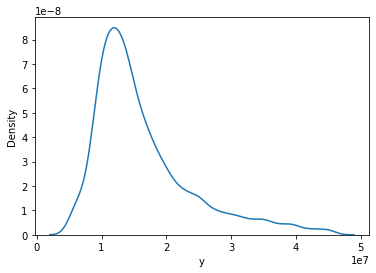

In [210]:
#sns.distplot(no_outliers['y'].dropna())
sns.distplot (no_outliers['y'], hist= False , kde= True )

In [356]:
y_boxcox, best_lambda = boxcox(no_outliers['y'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

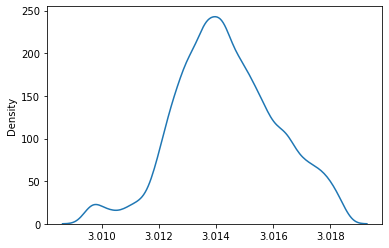

In [528]:
sns.distplot (y_boxcox, hist= False , kde= True )

In [358]:
y_boxcox

array([3.01776881, 3.01478299, 3.0177244 , ..., 3.0156415 , 3.01363665,
       3.01265672])

In [359]:
print(best_lambda)

-0.330314898383076


#### Преобразование x1

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='x1', ylabel='Density'>

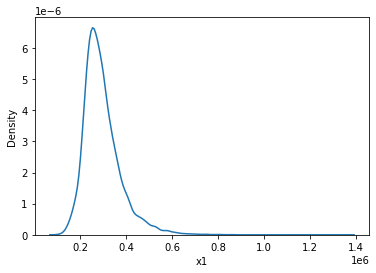

In [213]:
sns.distplot (no_outliers['x1'], hist= False , kde= True )

In [215]:
x1_boxcox, best_lambda = boxcox(no_outliers['x1']) 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

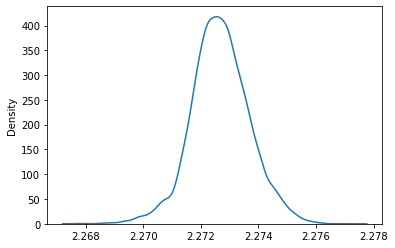

In [216]:
sns.distplot (x1_boxcox, hist= False , kde= True )

In [222]:
x1_boxcox

array([2.27156591, 2.27053235, 2.27436773, ..., 2.27214013, 2.27036141,
       2.27215755])

Видно, что после преобразования целевой переменной y и фактора x1, данные приняли нормальное распределение.

Попробуем преобразовать данные с помощью этого метода, построить модель и посмотреть на результат, возможно это поможет избавиться от проблемы наличия гетероскедастичности в остатках.

In [383]:
stat_df = no_outliers[['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']].copy()

In [384]:
boxcox_df = pd.DataFrame(columns=['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1'])
lambda_df = pd.DataFrame(columns=['factor', 'lambda'])

In [289]:
COLS = ['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']
for COL in COLS:
   Z = len(stat_df[stat_df[COL] <= 0])
   print('Кол-во экземпляров в ',COL, ':', Z) 

Кол-во экземпляров в  y : 0
Кол-во экземпляров в  x1 : 0
Кол-во экземпляров в  x2 : 0
Кол-во экземпляров в  x4 : 0
Кол-во экземпляров в  x5 : 397
Кол-во экземпляров в  x6 : 0
Кол-во экземпляров в  x7 : 10
Кол-во экземпляров в  x8 : 0
Кол-во экземпляров в  x9 : 7
Кол-во экземпляров в  x10 : 0
Кол-во экземпляров в  w1 : 12386
Кол-во экземпляров в  w3 : 10546
Кол-во экземпляров в  v1 : 613
Кол-во экземпляров в  h1 : 11811
Кол-во экземпляров в  h5 : 722
Кол-во экземпляров в  d1 : 10309


In [385]:
y_boxcox, y_lambda = boxcox(stat_df['y'])
boxcox_df['y'] = y_boxcox.tolist()
lambda_df.loc[len(lambda_df.index )] = ['y', y_lambda]


x1_boxcox, x1_lambda = boxcox(stat_df['x1'])
boxcox_df['x1'] = x1_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x1', x1_lambda]

x2_boxcox, x2_lambda = boxcox(stat_df['x2'])
boxcox_df['x2'] = x2_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x2', x2_lambda]

x4_boxcox, x4_lambda = boxcox(stat_df['x4'])
boxcox_df['x4'] = x4_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x4', x4_lambda]

posx5 = stat_df.loc[stat_df['x5'] > 0, 'x5']
x5_boxcox, x5_lambda = boxcox(posx5)
x5 = stat_df['x5']
x5[x5 > 0] = x5_boxcox
x5[x5 == 0] = -1/x5_lambda
boxcox_df['x5'] = x5.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x5', x5_lambda]

x6_boxcox, x6_lambda = boxcox(stat_df['x6'])
boxcox_df['x6'] = x6_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x6', x6_lambda]

posx7 = stat_df.loc[stat_df['x7'] > 0, 'x7']
x7_boxcox, x7_lambda = boxcox(posx7)
x7 = stat_df['x7']
x7[x7 > 0] = x7_boxcox
x7[x7 == 0] = -1/x7_lambda
boxcox_df['x7'] = x7.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x7', x7_lambda]

x8_boxcox, x8_lambda = boxcox(stat_df['x8'])
boxcox_df['x8'] = x8_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x8', x8_lambda]

posx9 = stat_df.loc[stat_df['x9'] > 0, 'x9']
x9_boxcox, x9_lambda = boxcox(posx9)
x9 = stat_df['x9']
x9[x9 > 0] = x9_boxcox
x9[x9 == 0] = -1/x9_lambda
boxcox_df['x9'] = x9.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x9', x9_lambda]

x10_boxcox, x10_lambda = boxcox(stat_df['x10'])
boxcox_df['x10'] = x10_boxcox.tolist() 
lambda_df.loc[len(lambda_df.index )] = ['x10', x10_lambda]

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1880\2119677117.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x5[x5 > 0] = x5_boxcox
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1880\2119677117.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x7[x7 > 0] = x7_boxcox
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1880\2119677117.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x9[x9 > 0] = x9_boxcox


In [386]:
boxcox_df['w1'] = stat_df['w1'].tolist()
boxcox_df['w3'] = stat_df['w3'].tolist()
boxcox_df['v1'] = stat_df['v1'].tolist()
boxcox_df['h1'] = stat_df['h1'].tolist()
boxcox_df['h5'] = stat_df['h5'].tolist()
boxcox_df['d1'] = stat_df['d1'].tolist()

In [387]:
boxcox_df.head()

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
0,3.017769,2.271566,5.019969,4.032164,1.377709,2.396601,5.196925,4.507398,-5.570690,4.030448,0,1,1,0,1,1
1,3.014783,2.270532,4.438794,2.998413,0.798091,3.826038,3.787487,8.042977,2.520708,5.941736,0,0,1,0,1,0
2,3.017724,2.274368,4.316011,2.360779,1.377709,2.396601,2.354055,23.085554,2.329060,2.955801,0,0,1,0,1,0
3,3.017246,2.272682,4.615738,2.959314,1.377709,4.196255,5.196925,4.998876,-5.570690,3.993545,0,1,1,0,1,1
4,3.017347,2.272805,4.615738,3.177768,1.377709,4.923035,5.196925,4.507398,-5.570690,4.030360,0,1,1,0,1,1


In [388]:
lambda_df

,factor,lambda
0,y,-0.330315
1,x1,-0.438212
2,x2,-0.006946
3,x4,0.064588
4,x5,0.397655
5,x6,0.133445
6,x7,0.116933
7,x8,0.667957
8,x9,0.179511
9,x10,0.466256


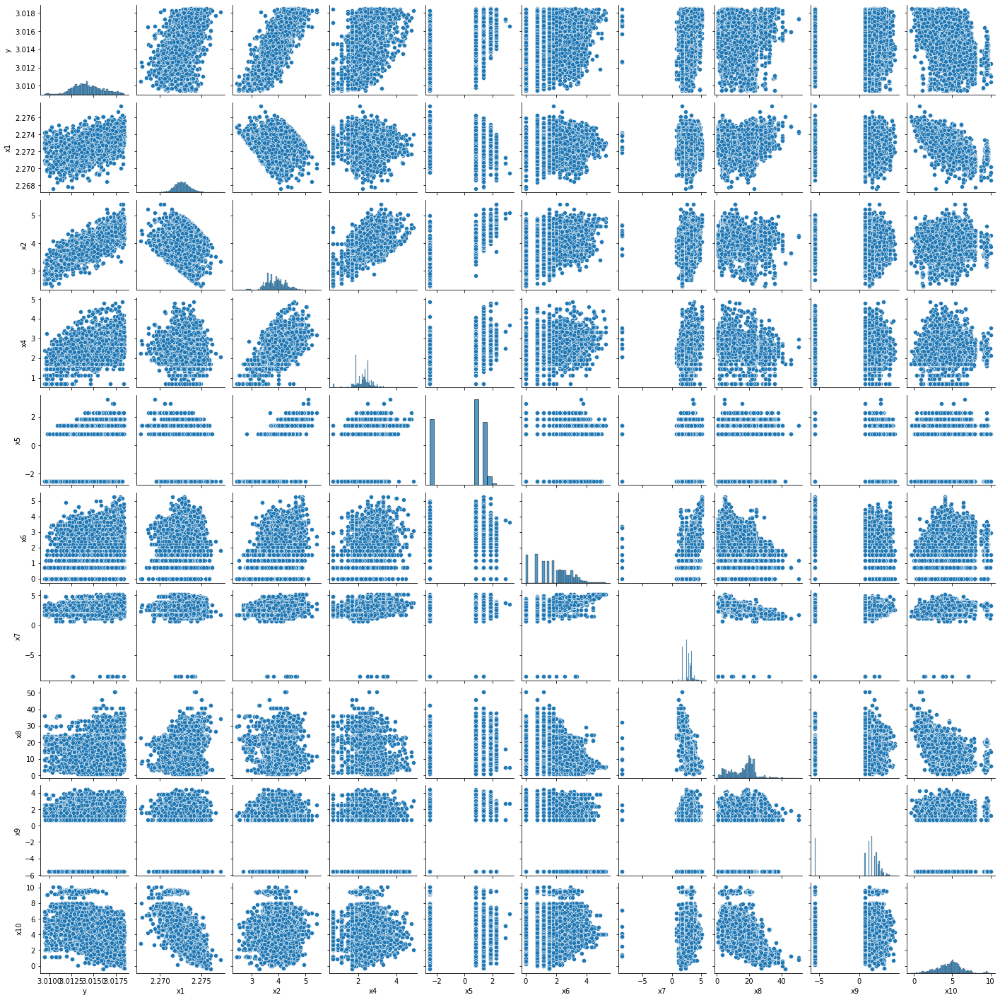

In [394]:
sns.pairplot(boxcox_df[['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']], height=2);

### Модель после преобразования Бокса-Кокса

In [389]:
Y_bc = boxcox_df['y']

X_bc = boxcox_df[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']]

In [390]:
X_train_bc, X_test_bc, Y_train_bc, Y_test_bc = train_test_split(X_bc, Y_bc, test_size=0.25, random_state=0)

In [391]:
X_train_bc = sm.add_constant(X_train_bc)
model_bc = sm.OLS(Y_train_bc, X_train_bc).fit()

model_bc.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                 8.098e+04
Date:                Sat, 22 Apr 2023   Prob (F-statistic):               0.00
Time:                        00:56:01   Log-Likelihood:                 68401.
No. Observations:                9291   AIC:                        -1.368e+05
Df Residuals:                    9275   BIC:                        -1.367e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6460      0.005    125.325      0.000       0.636       0.656
x1             1.0348      0.002    457.269      0.000       1.030       1.039
x2             0.0042   9.74e-06    427.992      0.000       0.004       0.004
x4          9.449e-05   5.41e-06     17.475      0.000    8.39e-05       0.000
x5          4.055e-05    1.7e-06     23.829      0.000    3.72e-05    4.39e-05
x6          1.558e-05   1.72e-06      9.049      0.000    1.22e-05     1.9e-05
x7         -6.241e-06   2.81e-06     -2.224      0.026   -1.17e-05    -7.4e-07
x8          1.132e-06   4.82e-07      2.346      0.019    1.86e-07    2.08e-06
x9         -9.558e-07      6e-07     -1.594      0.111   -2.13e-06     2.2e-07
x10         2.718e-06   1.58e-06      1.717      0.086   -3.84e-07    5.82e-06
w1            -0.0003   8.89e-05     -3.006      0.003      -0.000    -9.3e-05
w3         -6.741e-05   5.85e-06    -11.522      0.000   -7.89e-05   -5.59e-05
v1          8.003e-05    8.5e-06      9.418      0.000    6.34e-05    9.67e-05
h1          7.153e-05   1.67e-05      4.296      0.000    3.89e-05       0.000
h5          2.213e-05    1.5e-05      1.473      0.141   -7.33e-06    5.16e-05
d1           3.48e-05   6.97e-06      4.992      0.000    2.11e-05    4.85e-05
==============================================================================
Omnibus:                     1436.372   Durbin-Watson:                   2.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8558.848
Skew:                          -0.605   Prob(JB):                         0.00
Kurtosis:                       7.544   Cond. No.                     6.63e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.63e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [392]:
Breush_Pagan_test(model_bc, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Breush-Pagan test,0.95,0.05,890.998684,2.977391e-180,True,65.587393,8.024149e-190,True,heteroscedasticity


In [393]:
Goldfeld_Quandt_test(model_bc, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Goldfeld–Quandt test,0.95,0.05,1.198855,3.510894e-10,True,heteroscedasticity


Из тестов видно, что Преобразование Бокса-Кокса не помогло избавиться от гетроскедастичности в остатках.

# Нормализация данных

In [167]:
from sklearn import preprocessing

In [426]:
stat_df = no_outliers[['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']].copy()

In [173]:
stat_df.head()

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
0,36200000.0,218599.0,165.6,36.0,3,8,58,8,1,9.661126,0,1,1,0,1,1
1,16000000.0,176211.0,90.8,15.5,2,22,23,16,8,17.226491,0,0,1,0,1,0
2,35700000.0,446250.0,80.0,9.0,3,8,8,66,7,6.411227,0,0,1,0,1,0
3,30850000.0,283028.0,109.0,15.0,3,28,58,9,1,9.537724,0,1,1,0,1,1
4,31800000.0,291743.0,109.0,18.0,3,44,58,8,1,9.660830,0,1,1,0,1,1


### Мин-макс нормализация

In [174]:
normalize_df = (stat_df-stat_df.min())/(stat_df.max()-stat_df.min())

In [425]:
normalize_df.head(10)

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
0,0.76750,0.090342,0.645527,0.507463,0.375,0.132075,1.000000,0.029851,0.038462,0.219664,0.0,1.0,1.0,0.0,1.0,1.0
1,0.26250,0.056440,0.331373,0.201493,0.250,0.396226,0.396552,0.069652,0.307692,0.404019,0.0,0.0,1.0,0.0,1.0,0.0
2,0.75500,0.272421,0.286014,0.104478,0.375,0.132075,0.137931,0.318408,0.269231,0.140469,0.0,0.0,1.0,0.0,1.0,0.0
3,0.63375,0.141874,0.407812,0.194030,0.375,0.509434,1.000000,0.034826,0.038462,0.216657,0.0,1.0,1.0,0.0,1.0,1.0
4,0.65750,0.148844,0.407812,0.238806,0.375,0.811321,1.000000,0.029851,0.038462,0.219657,0.0,1.0,1.0,0.0,1.0,1.0
5,0.11000,0.166874,0.082318,0.047761,0.250,0.000000,0.086207,0.283582,0.192308,0.260132,0.0,0.0,1.0,0.0,1.0,0.0
7,0.20000,0.083689,0.219656,0.089552,0.250,0.018868,0.086207,0.318408,0.115385,0.274567,0.0,0.0,1.0,0.0,1.0,0.0
8,0.26250,0.144841,0.184376,0.059701,0.375,0.056604,0.086207,0.303483,0.153846,0.193117,0.0,0.0,1.0,0.0,1.0,0.0
9,0.27125,0.094641,0.256615,0.119403,0.375,0.018868,0.275862,0.208955,0.115385,0.369104,0.0,0.0,1.0,0.0,1.0,0.0
10,0.15000,0.131416,0.128937,0.059701,0.250,0.075472,0.086207,0.293532,0.153846,0.173732,0.0,0.0,1.0,0.0,1.0,0.0


In [198]:
Y_norm = normalize_df['y']

X_norm = normalize_df[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']]

In [199]:
X_train_norm, X_test_norm, Y_train_norm, Y_test_norm = train_test_split(X_norm, Y_norm, test_size=0.25, random_state=0)

In [200]:
X_train_norm = sm.add_constant(X_train_norm)
model_norm = sm.OLS(Y_train_norm, X_train_norm).fit()

model_norm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                 1.083e+04
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:48:10   Log-Likelihood:                 15804.
No. Observations:                9291   AIC:                        -3.158e+04
Df Residuals:                    9275   BIC:                        -3.146e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2723      0.006    -42.125      0.000      -0.285      -0.260
x1             1.7021      0.009    185.099      0.000       1.684       1.720
x2             1.5873      0.011    147.770      0.000       1.566       1.608
x4             0.0751      0.009      8.150      0.000       0.057       0.093
x5             0.0735      0.007      9.894      0.000       0.059       0.088
x6            -0.0123      0.005     -2.273      0.023      -0.023      -0.002
x7             0.0143      0.006      2.309      0.021       0.002       0.026
x8            -0.0205      0.008     -2.725      0.006      -0.035      -0.006
x9             0.0211      0.004      5.856      0.000       0.014       0.028
x10           -0.0160      0.004     -3.640      0.000      -0.025      -0.007
w1             0.0822      0.026      3.219      0.001       0.032       0.132
w3             0.0104      0.002      6.129      0.000       0.007       0.014
v1            -0.0176      0.002     -7.053      0.000      -0.022      -0.013
h1            -0.0192      0.005     -4.043      0.000      -0.029      -0.010
h5            -0.0168      0.004     -3.912      0.000      -0.025      -0.008
d1            -0.0110      0.002     -5.929      0.000      -0.015      -0.007
==============================================================================
Omnibus:                     5141.835   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           207501.365
Skew:                          -2.002   Prob(JB):                         0.00
Kurtosis:                      25.803   Cond. No.                         100.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [201]:
Breush_Pagan_test(model_norm, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Breush-Pagan test,0.95,0.05,1629.12502,0.0,True,131.474646,0.0,True,heteroscedasticity


In [202]:
Goldfeld_Quandt_test(model_norm, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Goldfeld–Quandt test,0.95,0.05,1.337863,2.429721e-23,True,heteroscedasticity


Мин-макс нормализация не дала результата, гетероскедастичность остатков всё ещё присутствует.

### Нормализация через sklearn.MinMaxScaler() (даёт тот же результат, что и Мин-макс нормализация чрез формулу)

In [427]:
min_max_Scalar = preprocessing.MinMaxScaler()

In [429]:
col = stat_df.columns
result = min_max_Scalar.fit_transform(stat_df)
min_max_Scalar_df = pd.DataFrame(result, columns=col)

In [430]:
min_max_Scalar_df.head(10)

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
0,0.76750,0.090342,0.645527,0.507463,0.375,0.132075,1.000000,0.029851,0.038462,0.219664,0.0,1.0,1.0,0.0,1.0,1.0
1,0.26250,0.056440,0.331373,0.201493,0.250,0.396226,0.396552,0.069652,0.307692,0.404019,0.0,0.0,1.0,0.0,1.0,0.0
2,0.75500,0.272421,0.286014,0.104478,0.375,0.132075,0.137931,0.318408,0.269231,0.140469,0.0,0.0,1.0,0.0,1.0,0.0
3,0.63375,0.141874,0.407812,0.194030,0.375,0.509434,1.000000,0.034826,0.038462,0.216657,0.0,1.0,1.0,0.0,1.0,1.0
4,0.65750,0.148844,0.407812,0.238806,0.375,0.811321,1.000000,0.029851,0.038462,0.219657,0.0,1.0,1.0,0.0,1.0,1.0
5,0.11000,0.166874,0.082318,0.047761,0.250,0.000000,0.086207,0.283582,0.192308,0.260132,0.0,0.0,1.0,0.0,1.0,0.0
6,0.20000,0.083689,0.219656,0.089552,0.250,0.018868,0.086207,0.318408,0.115385,0.274567,0.0,0.0,1.0,0.0,1.0,0.0
7,0.26250,0.144841,0.184376,0.059701,0.375,0.056604,0.086207,0.303483,0.153846,0.193117,0.0,0.0,1.0,0.0,1.0,0.0
8,0.27125,0.094641,0.256615,0.119403,0.375,0.018868,0.275862,0.208955,0.115385,0.369104,0.0,0.0,1.0,0.0,1.0,0.0
9,0.15000,0.131416,0.128937,0.059701,0.250,0.075472,0.086207,0.293532,0.153846,0.173732,0.0,0.0,1.0,0.0,1.0,0.0


### Нормализация через sklearn.preprocessing.normalize

In [587]:
resS = preprocessing.normalize(stat_df)

In [588]:
resS_df = pd.DataFrame(data=resS, columns=['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1'])

In [589]:
resS_df.head()

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
0,0.999982,0.006039,0.000005,9.944570e-07,8.287142e-08,2.209904e-07,1.602181e-06,2.209904e-07,2.762381e-08,2.668771e-07,0.0,2.762381e-08,2.762381e-08,0.0,2.762381e-08,2.762381e-08
1,0.999939,0.011013,0.000006,9.686913e-07,1.249924e-07,1.374917e-06,1.437413e-06,9.999394e-07,4.999697e-07,1.076590e-06,0.0,0.000000e+00,6.249621e-08,0.0,6.249621e-08,0.000000e+00
2,0.999922,0.012499,0.000002,2.520811e-07,8.402705e-08,2.240721e-07,2.240721e-07,1.848595e-06,1.960631e-07,1.795722e-07,0.0,0.000000e+00,2.800902e-08,0.0,2.800902e-08,0.000000e+00
3,0.999958,0.009174,0.000004,4.862032e-07,9.724064e-08,9.075793e-07,1.879986e-06,2.917219e-07,3.241355e-08,3.091515e-07,0.0,3.241355e-08,3.241355e-08,0.0,3.241355e-08,3.241355e-08
4,0.999958,0.009174,0.000003,5.660139e-07,9.433565e-08,1.383590e-06,1.823823e-06,2.515617e-07,3.144522e-08,3.037869e-07,0.0,3.144522e-08,3.144522e-08,0.0,3.144522e-08,3.144522e-08


In [590]:
Y_resS = resS_df['y']

X_resS = resS_df[['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1']]

In [591]:
X_train_resS, X_test_resS, Y_train_resS, Y_test_resS = train_test_split(X_resS, Y_resS, test_size=0.25, random_state=0)

In [592]:
X_train_resS = sm.add_constant(X_train_resS)
model_resS = sm.OLS(Y_train_resS, X_train_resS).fit()

model_resS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     8053.
Date:                Fri, 28 Apr 2023   Prob (F-statistic):               0.00
Time:                        22:03:16   Log-Likelihood:                 76271.
No. Observations:                9291   AIC:                        -1.525e+05
Df Residuals:                    9275   BIC:                        -1.524e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0006   6.31e-06   1.59e+05      0.000       1.001       1.001
x1            -0.0392      0.000   -144.423      0.000      -0.040      -0.039
x2          -105.8513      1.931    -54.811      0.000    -109.637    -102.066
x4            85.6032      3.423     25.007      0.000      78.893      92.313
x5           520.5925     21.329     24.408      0.000     478.783     562.402
x6            22.4639      2.109     10.649      0.000      18.329      26.599
x7             5.8023      2.039      2.845      0.004       1.805       9.800
x8             4.7571      0.690      6.898      0.000       3.405       6.109
x9            14.7054      2.631      5.589      0.000       9.548      19.863
x10           20.1929      1.819     11.100      0.000      16.627      23.759
w1          -208.4225    601.634     -0.346      0.729   -1387.758     970.913
w3           -50.7871     36.630     -1.386      0.166    -122.590      21.015
v1          1014.8928     45.860     22.130      0.000     924.998    1104.788
h1          1802.0381     90.876     19.830      0.000    1623.901    1980.175
h5          2017.6809     79.618     25.342      0.000    1861.613    2173.749
d1            74.1961     39.253      1.890      0.059      -2.749     151.142
==============================================================================
Omnibus:                     9036.193   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1176717.859
Skew:                          -4.378   Prob(JB):                         0.00
Kurtosis:                      57.433   Cond. No.                     8.80e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.2e-14. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [578]:
name_columns.loc[name_columns['variable']. isin(['y', 'x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'w1', 'w3', 'v1', 'h1', 'h5', 'd1'])]

,name,variable
2,price,y
3,price_by_meter,x1
4,area,x2
6,kitchen_area,x4
7,rooms,x5
8,level,x6
9,max_levels,x7
10,build_age,x8
11,enterances,x9
12,remoute_from_center,x10


In [603]:
Breush_Pagan_test(model_resS, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,Lagrange_multiplier_statistic,p_calc_LM,p_calc_LM < a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Breush-Pagan test,0.95,0.05,2638.245869,0.0,True,245.209026,0.0,True,heteroscedasticity


In [594]:
Goldfeld_Quandt_test(model_resS, p_level=0.95, model_name='linear_ols')

,test,p_level,a_level,F_statistic,p_calc,p_calc < a_level,heteroscedasticity_check
linear_ols,Goldfeld–Quandt test,0.95,0.05,0.993391,0.589234,False,not heteroscedasticity


Данные тесты используют следующие нулевые и альтернативные гипотезы:   
Нулевая гипотеза (H0): присутствует гомоскедастичность.   
Альтернативная гипотеза (H1): гомоскедастичность отсутствует (т.е. гетероскедастичность существует).   

В тесте Голдфельда-Квандта значение F-статитстики равно 0.993391, а соответствующее p-значение равно 0.589234, поскольку это p-значение не меньше 0.05, мы не можем отвергнуть нулевую гипотезу, следовательно у нас нет достаточных доказательств того, что в регрессионной модели присутствует гетероскедастичность.   
Тест Голдфельда-Квандта показывает отсутствие гетероскедастичности.

In [453]:
X_test_resS = sm.add_constant(X_test_resS)

# прогноз на тестовых данных
Y_test_pred_resS = model_resS.predict(X_test_resS)
comparison_resS = pd.DataFrame({'y Real (price)': Y_test_resS, 'y Predicted': Y_test_pred_resS})
comparison_resS.head(20)

,y Real (price),y Predicted
10889,0.999878,0.999887
1460,0.999929,1.000013
2343,0.999770,0.999745
3993,0.999753,0.999728
9698,0.999643,0.999638
2517,0.999743,0.999721
2443,0.999870,0.999895
9785,0.999835,0.999824
10085,0.999919,0.999963
7088,0.999956,0.999996


In [456]:
Y_train_pred_resS = model_resS.predict(X_train_resS)

In [457]:
print('MSE train: {:.3f}, test: {:.3f}'.format(
        mean_squared_error(Y_train_resS, Y_train_pred_resS),
        mean_squared_error(Y_test_resS, Y_test_pred_resS)))
print('R^2 train: {:.3f}, test: {:.3f}'.format(
        r2_score(Y_train_resS, Y_train_pred_resS),
        r2_score(Y_test_resS, Y_test_pred_resS)))

MSE train: 0.000, test: 0.000
R^2 train: 0.929, test: 0.930


In [458]:
print('Средняя ошибка аппроксимации (MAPE) в тестовой выборке: ', mape(Y_test_resS, Y_test_pred_resS), '%')
print('Средняя ошибка аппроксимации (MAPE) в обучающей выборке: ', mape(Y_train_resS, Y_train_pred_resS), '%')

Средняя ошибка аппроксимации (MAPE) в тестовой выборке:  0.0040324315750435566 %
Средняя ошибка аппроксимации (MAPE) в обучающей выборке:  0.0039882329936027135 %


#### ВЫВОД:   
Благодаря нормализации данных удалось избавиться от гетероскедастичности остатков.

# Заметки (черновики)

##### Расчёт стандаротной ошибки регрессии для составления прогноза в excel

In [562]:
model_resS.resid.head()

1646    -0.000020
9340    -0.000013
3055     0.000021
5140    -0.000004
11583    0.000003
dtype: float64

In [565]:
residuals = model_resS.resid**2

In [566]:
residuals.head()

1646     4.192121e-10
9340     1.796121e-10
3055     4.460482e-10
5140     1.415587e-11
11583    9.875869e-12
dtype: float64

In [575]:
summa_resid = sum(residuals)
summa_resid

4.029336751163795e-05

In [574]:
number_of_degrees_freedom = len(train_data)-15-1
number_of_degrees_freedom

9275

In [577]:
# стандартная ошибка регрессии для построения доверительных интервалов прогноза
S = np.sqrt(summa_resid / number_of_degrees_freedom)
S

6.591129177920952e-05

In [549]:
test_data = X_test_resS.copy()

In [551]:
test_data.insert(0, 'y', Y_test_resS)

In [552]:
test_data.head()

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
10889,0.999878,0.015599,0.000005,5.105762e-07,2.127401e-07,1.418267e-07,8.509603e-07,3.687495e-06,6.382202e-07,1.228803e-06,0.0,0.0,7.091336e-08,0.0,7.091336e-08,0.0
1460,0.999929,0.011904,0.000002,5.709740e-07,5.796691e-08,3.767849e-07,4.927187e-07,5.506856e-07,1.449173e-07,1.669889e-07,0.0,0.0,2.898345e-08,0.0,2.898345e-08,0.0
2343,0.999770,0.021454,0.000003,6.141931e-07,1.364873e-07,3.412184e-07,8.189241e-07,3.480427e-06,6.824367e-08,5.430418e-07,0.0,0.0,6.824367e-08,0.0,6.824367e-08,0.0
3993,0.999753,0.022217,0.000004,5.831894e-07,1.666255e-07,8.331277e-08,7.498149e-07,4.665515e-06,3.332511e-07,1.088853e-06,0.0,0.0,8.331277e-08,0.0,8.331277e-08,0.0
9698,0.999643,0.026728,0.000004,8.582791e-07,1.009740e-07,1.211688e-06,1.716558e-06,3.332142e-06,5.048701e-07,2.104804e-06,0.0,0.0,1.009740e-07,0.0,1.009740e-07,0.0


In [553]:
train_data = X_train_resS.copy()
train_data.insert(0, 'y', Y_train_resS)

In [555]:
train_data.drop('const', axis=1 , inplace=True)

In [556]:
train_data.head()

,y,x1,x2,x4,x5,x6,x7,x8,x9,x10,w1,w3,v1,h1,h5,d1
1646,0.999913,0.013157,0.000004,5.813450e-07,1.744035e-07,6.976140e-07,8.138830e-07,1.511497e-06,2.906725e-07,8.837119e-07,0.0,0.0,5.813450e-08,0.000000e+00,5.813450e-08,0.000000e+00
9340,0.999881,0.015407,0.000004,5.343387e-07,2.003770e-07,6.011310e-07,1.068677e-06,3.139240e-06,6.679234e-08,9.169485e-07,0.0,0.0,6.679234e-08,0.000000e+00,6.679234e-08,0.000000e+00
3055,0.999578,0.029057,0.000004,8.935439e-07,1.191392e-07,1.191392e-07,1.429670e-06,5.956959e-06,4.765567e-07,1.624240e-06,0.0,0.0,1.191392e-07,0.000000e+00,1.191392e-07,0.000000e+00
5140,0.999829,0.018515,0.000004,6.568217e-07,1.459604e-07,4.378811e-07,1.167683e-06,3.430069e-06,8.757623e-07,1.250252e-06,0.0,0.0,7.298019e-08,0.000000e+00,7.298019e-08,0.000000e+00
11583,0.999881,0.015430,0.000006,9.564079e-07,1.738923e-07,1.651977e-06,1.738923e-06,6.955694e-07,6.086232e-07,2.231812e-06,0.0,0.0,8.694617e-08,8.694617e-08,0.000000e+00,8.694617e-08


In [557]:
test_data.to_excel ('./test_data.xlsx')

In [558]:
train_data.to_excel ('./train_data.xlsx')

In [484]:
def White_test(
    model_fit,
    p_level: float=0.95,
    model_name=''):
    
    a_level = 1 - p_level
    
    # реализация теста
    test = het_white(model_fit.resid, model_fit.model.exog)
    name = ['Lagrange_multiplier_statistic', 'p_calc_LM', 'F_statistic', 'p_calc']
    test_result = list(zip(name, test))    # распаковка результатов теста
    # расчетное значение статистики теста множителей Лагранжа
    LM_calc_tuple = test_result[0]
    Lagrange_multiplier_statistic = LM_calc_tuple[1]
    # расчетный уровень значимости статистики теста множителей Лагранжа
    p_calc_LM_tuple = test_result[1]
    p_calc_LM = p_calc_LM_tuple[1]
    # расчетное значение F-статистики гипотезы о том, что дисперсия ошибки не зависит от x
    F_calc_tuple = test_result[2]
    F_statistic = F_calc_tuple[1]
    # расчетный уровень значимости F-статистики
    p_calc_tuple = test_result[3]
    p_calc = p_calc_tuple[1]
    # вывод
    conclusion_test = 'heteroscedasticity' if p_calc < a_level else 'not heteroscedasticity'

    # вывод
    conclusion_test = 'heteroscedasticity' if p_calc < a_level else 'not heteroscedasticity'
    
    result = pd.DataFrame({
        'test': ('White test'),
        'p_level': (p_level),
        'a_level': (a_level),
        'Lagrange_multiplier_statistic': (Lagrange_multiplier_statistic),
        'p_calc_LM': (p_calc_LM),
        'p_calc_LM < a_level': (p_calc_LM < a_level),
        'F_statistic': (F_statistic),
        'p_calc': (p_calc),
        'p_calc < a_level': (p_calc < a_level),
        'heteroscedasticity_check': (conclusion_test)
        },
        index=[model_name])
    
    return result

plt.figure(figsize=(8,5))   
plt.scatter(Y_train_pred_resS,  model_resS.resid,   
            c='lightgreen', marker='o')   
plt.xlabel('y Predicted')   
plt.ylabel('residuals (E)')   
plt.hlines(y=0, xmin=0.9974, xmax=1.0003, lw=3, color='black')   
plt.title('График остатков', fontsize=18, fontweight='bold')   
plt.tight_layout()   